In [1]:
#xrs时间列表记录，分辨率不同，需要分开运行
import datetime
import time
import xlrd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as spio   #用来读取sav格式 
import csv 
#from scipy import interpolate
import scipy
sheet_xrs_time = pd.read_csv('xrs_2010-2016_time.csv')
sheet_lya_time = pd.read_csv('lya_2010-2016_time_change_1.csv')
l_index=range(100)
sheet3_x_time = pd.DataFrame()
sheet3_x_value = pd.DataFrame()
x_num_list=[] #把对应的中断的位置点记录下来，便于和后面的数值对应，不能直接记录时间，需要记录m
list_year=[]
list_time_end=[]
for i in range(len(sheet_lya_time['DATE'])):
    a=sheet_lya_time['DATE'][i].split('-')[0]+sheet_lya_time['DATE'][i].split('-')[1]+sheet_lya_time['DATE'][i].split('-')[2]
    if(a=='20150819'):#中断点，不记录
        print('20150819跳过数据')
        continue
    
    list_year.append(sheet_lya_time['DATE'][i].split('-')[0]+sheet_lya_time['DATE'][i].split('-')[1]+sheet_lya_time['DATE'][i].split('-')[2])
    list_time_end.append(int(sheet_lya_time['PEAKT'][i][0:2])*3600+int(sheet_lya_time['PEAKT'][i][3:5])*60+int(sheet_lya_time['PEAKT'][i][6:8])+3600)

#sheet_xrs = pd.DataFrame()
k=0
n=0
for  i in list_year:
    try: #处理文件不存在的情况
        print(i)
        if(n<list_year.index('20101019')):#2010年10月19日后的数据是g15
            sheet_xrs = spio.readsav('/home/tzy/flare_data/sav/lc'+i+'_xrs_g14.sav',python_dict=True, verbose=False)
        else:
            sheet_xrs = spio.readsav('/home/tzy/flare_data/sav/lc'+i+'_xrs_g15.sav',python_dict=True, verbose=False)
    except:
        print('该项数据文件缺少：',i)
        continue
    m=0
    break_out_flag = False #跳出整个循环的标志    
    b=[]
    for j in range(len(sheet_xrs['tsecs'])):
        sheet3_x_time.loc[m,n]=sheet_xrs['tsecs'][j]-sheet_xrs['tsecs'][0]#取一个当天最开始时间戳，后面的时间减这个时间得到的就是0时以后的秒数，可以转为时   
        sheet3_x_value.loc[m,n]=sheet_xrs['yclean'][0][j]#yclean的数据有两列，选第一列
        if((list_time_end[n]-sheet3_x_time.loc[m,n])<10): #取一个阈值
            
            print('中断点:',sheet3_x_time.loc[m,n])
            break_out_flag = True #满足条件，标记为True
            break   #选择在耀斑结束后一小时结束循环
        m=m+1;
    n=n+1;
    if(break_out_flag): #这里用了一个标志位一次性跳出嵌套循环
        x_num_list.append(m)
        print('中断位置已存入列表：',m)
    else:
        x_num_list.append(m-1)
        print('非中断位置：',m-1)

20150819跳过数据
20100409
中断点: 21058.0
中断位置已存入列表： 10282
20100609
中断点: 35428.0
中断位置已存入列表： 17299
20100731
中断点: 23275.0
中断位置已存入列表： 11365
20101019
中断点: 51762.55900001526
中断位置已存入列表： 25270
20101023
中断点: 66780.38300001621
中断位置已存入列表： 32608
20101026
中断点: 15294.307000041008
中断位置已存入列表： 7468
20101110
中断点: 63487.02699995041
中断位置已存入列表： 31000
20101116
中断点: 14843.68599998951
中断位置已存入列表： 7237
20110104
中断点: 38872.47699999809
中断位置已存入列表： 18950
20110126
中断点: 83415.86699998379
中断位置已存入列表： 40258
20110211
中断点: 81716.01600003242
中断位置已存入列表： 39901
20110212
中断点: 42884.422000050545
中断位置已存入列表： 20940
20110325
中断点: 14350.146999955177
中断位置已存入列表： 7007
20110329
中断点: 5425.082999944687
中断位置已存入列表： 2649
20110331
中断点: 81537.74199998379
中断位置已存入列表： 39814
20110501
中断点: 39521.69099998474
中断位置已存入列表： 19298
20110616
非中断位置： 42187
20110810
中断点: 52401.39499998093
中断位置已存入列表： 25587
20110907
中断点: 70003.64100003242
中断位置已存入列表： 34182
20111002
中断点: 72965.0
中断位置已存入列表： 35628
20111013
中断点: 57160.83599996567
中断位置已存入列表： 27911
20111218
中断点: 45674.195000

In [2]:
#lya时间列表记录，分辨率不同，需要分开运行,10s分辨率
import datetime
import time
import xlrd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as spio   #用来读取sav格式
import numpy as np 
import csv 
#from scipy import interpolate
import scipy
sheet_xrs_time = pd.read_csv('xrs_2010-2016_time.csv')
sheet_lya_time = pd.read_csv('lya_2010-2016_time_change_1.csv')
l_index=range(100)
sheet3_lya_time = pd.DataFrame()
sheet3_lya_value = pd.DataFrame()
lya_num_list=[] #把对应的中断的位置点记录下来，便于和后面的数值对应，不能直接记录时间，需要记录m
list_year=[]
list_time_end=[]
for i in range(len(sheet_lya_time['DATE'])):
    a=sheet_lya_time['DATE'][i].split('-')[0]+sheet_lya_time['DATE'][i].split('-')[1]+sheet_lya_time['DATE'][i].split('-')[2]
    if(a=='20150819'):#中断点，不记录
        print('20150819跳过数据')
        continue
    list_year.append(sheet_lya_time['DATE'][i].split('-')[0]+sheet_lya_time['DATE'][i].split('-')[1]+sheet_lya_time['DATE'][i].split('-')[2])
    list_time_end.append(int(sheet_lya_time['PEAKT'][i][0:2])*3600+int(sheet_lya_time['PEAKT'][i][3:5])*60+int(sheet_lya_time['PEAKT'][i][6:8])+3600)

#sheet_xrs = pd.DataFrame()
k=0
n=0
for  i in list_year:
    try: #处理文件不存在的情况
        print(i)
        if(n<list_year.index('20100409')):#2010年4月9日后的数据是g15
            sheet_lya = spio.readsav('/home/tzy/flare_data/sav/lc'+i+'_euve_g14.sav',python_dict=True, verbose=False)
        else:
            sheet_lya = spio.readsav('/home/tzy/flare_data/sav/lc'+i+'_euve_g15.sav',python_dict=True, verbose=False)
    except:
        print('该项数据文件缺少：',i)
        continue
    m=0
    break_out_flag = False #跳出整个循环的标志    
    b=[]
    for j in range(len(sheet_lya['tsecs'])):
        sheet3_lya_time.loc[m,n]=sheet_lya['tsecs'][j]-sheet_lya['tsecs'][0]#取一个当天最开始时间戳，后面的时间减这个时间得到的就是0时以后的秒数，可以转为时   
        sheet3_lya_value.loc[m,n]=sheet_lya['yclean'][j]#yclean的数据有两列，选第一列
        if((list_time_end[n]-sheet3_lya_time.loc[m,n])<10): #取一个阈值
            
            print('中断点:',sheet3_lya_time.loc[m,n])
            break_out_flag = True #满足条件，标记为True
            break   #选择在耀斑结束后一小时结束循环
        m=m+1;
    n=n+1;
    if(break_out_flag): #这里用了一个标志位一次性跳出嵌套循环
        lya_num_list.append(m)
        print('中断位置已存入列表：',m)
    else:
        lya_num_list.append(m-1)
        print('非中断位置：',m-1)

20150819跳过数据
20100409
中断点: 23340.68299996853
中断位置已存入列表： 1803
20100609
中断点: 35432.074000000954
中断位置已存入列表： 3244
20100731
中断点: 23277.180000066757
中断位置已存入列表： 2131
20101019
中断点: 51762.46000003815
中断位置已存入列表： 4532
20101023
中断点: 66780.3029999733
中断位置已存入列表： 6111
20101026
中断点: 15302.486999988556
中断位置已存入列表： 1401
20101110
中断点: 63491.12299990654
中断位置已存入列表： 5813
20101116
中断点: 14843.68700003624
中断位置已存入列表： 1357
20110104
中断点: 38872.47599995136
中断位置已存入列表： 3553
20110126
中断点: 83426.1060000658
中断位置已存入列表： 7541
20110211
中断点: 81722.15699994564
中断位置已存入列表： 7482
20110212
中断点: 42892.614000082016
中断位置已存入列表： 3927
20110325
中断点: 14352.194000005722
中断位置已存入列表： 1314
20110329
中断点: 5429.180000066757
中断位置已存入列表： 497
20110331
中断点: 81537.74000000954
中断位置已存入列表： 6991
20110501
中断点: 39527.84000003338
中断位置已存入列表： 3619
20110616
非中断位置： 7851
20110810
中断点: 52405.49400007725
中断位置已存入列表： 4798
20110907
中断点: 70011.8370000124
中断位置已存入列表： 6078
20111002
中断点: 72973.19299995899
中断位置已存入列表： 6251
20111013
中断点: 57169.02600002289
中断位置已存入列表： 4957
20111

y' = y0x12/(x01x02) + y1(1/x12 – 1/x01) – y2x01/(x02x12)

In [834]:
import time

time_start = time.time()

#平滑函数，借用IDL里平滑函数方程



sheet3_x_smooth = pd.DataFrame()
w=15 #平滑步长
k=11#选择第多少幅图
    
if(x_num_list[k]-4000>=0): 
    c=x_num_list[k]-4000 #大致往前推两个小时，作为坐标轴开始
else:
    c=0


for i in range(len(sheet3_x_value[c:][k])):
    if (i>=(w-1)/2 and i<=len(sheet3_x_value[c:][k])-(w+1)/2):
        sheet3_x_smooth.loc[i,k]=sheet3_x_value.loc[c+int(i-w/2):c+int(i+w/2-1),k].mean() #求和平滑公式   
    else:
        sheet3_x_smooth.loc[i,k]=sheet3_x_value.loc[c+i,k]
print('第',k,'：列已经平滑完毕')

time_end = time.time()
print('Time cost = %fs' % (time_end - time_start))

第 11 ：列已经平滑完毕
Time cost = 29.320302s


In [835]:
import time
time_start = time.time()



#求导计算，拉格朗日插值
sheet3_x_diff = pd.DataFrame()
len_1=1
i=11
for j in range(0,len(sheet3_x_smooth[:][i])):
    try:
        y0=sheet3_x_smooth.loc[j-len_1][i]
        y1=sheet3_x_smooth.loc[j][i]
        y2=sheet3_x_smooth.loc[j+len_1][i]
        x0=sheet3_x_time.loc[j-len_1][i]
        x1=sheet3_x_time.loc[j][i]
        x2=sheet3_x_time.loc[j+len_1][i]
        sheet3_x_diff.loc[j,i]=y0*(x1-x2)/((x0-x1)*(x0-x2))+y1*(1/(x1-x2)-1/(x0-x1))-y2*(x0-x1)/((x0-x2)*(x1-x2))
    except:
        sheet3_x_diff.loc[j,i]=np.nan#左边是loc[,]右边是loc[][]

print('第',i,'列差分完毕')       
            
time_end = time.time()
print('Time cost = %fs' % (time_end - time_start))

第 11 列差分完毕
Time cost = 37.444241s


In [837]:
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from PIL import Image
import numpy as np
import os
str_x='20110212'
path = r'/home/tzy/Desktop/python_text/'+str_x+'_131A/'
filenames=os.listdir(path)
filenames.sort()
data_131A=[]
time_131A=[]
for file in filenames: 
    hdu_new = fits.open('/home/tzy/Desktop/python_text/'+str_x+'_131A/'+file);
    a=hdu_new[0].data.sum()/hdu_new[0].header['EXPTIME']
    t=int(file[20:22])*3600+int(file[22:24])*60+int(file[24:26])
    data_131A.append(a)
    time_131A.append(t)
    
path = r'/home/tzy/Desktop/python_text/'+str_x+'_193A/'
filenames=os.listdir(path)
filenames.sort()
data_193A=[]
time_193A=[]
for file in filenames: 
    hdu_new = fits.open('/home/tzy/Desktop/python_text/'+str_x+'_193A/'+file);
    a=hdu_new[0].data.sum()/hdu_new[0].header['EXPTIME']
    t=int(file[20:22])*3600+int(file[22:24])*60+int(file[24:26])
    data_193A.append(a)
    time_193A.append(t)

path = r'/home/tzy/Desktop/python_text/'+str_x+'_171A/'
filenames=os.listdir(path)
filenames.sort()
data_171A=[]
time_171A=[]
for file in filenames: 
    hdu_new = fits.open('/home/tzy/Desktop/python_text/'+str_x+'_171A/'+file);
    a=hdu_new[0].data.sum()/hdu_new[0].header['EXPTIME']
    t=int(file[20:22])*3600+int(file[22:24])*60+int(file[24:26])
    data_171A.append(a)
    time_171A.append(t)
    
path = r'/home/tzy/Desktop/python_text/'+str_x+'_304A/'
filenames=os.listdir(path)
filenames.sort()
data_304A=[]
time_304A=[]
for file in filenames: 
    hdu_new = fits.open('/home/tzy/Desktop/python_text/'+str_x+'_304A/'+file);
    a=hdu_new[0].data.sum()/hdu_new[0].header['EXPTIME']
    t=int(file[20:22])*3600+int(file[22:24])*60+int(file[24:26])
    data_304A.append(a)
    time_304A.append(t)
    
path = r'/home/tzy/Desktop/python_text/'+str_x+'_94A/'
filenames=os.listdir(path)
filenames.sort()
data_94A=[]
time_94A=[]
for file in filenames: 
    hdu_new = fits.open('/home/tzy/Desktop/python_text/'+str_x+'_94A/'+file);
    a=hdu_new[0].data.sum()/hdu_new[0].header['EXPTIME']
    t=int(file[20:22])*3600+int(file[22:24])*60+int(file[24:26])
    data_94A.append(a)
    time_94A.append(t)

path = r'/home/tzy/Desktop/python_text/'+str_x+'_211A/'
filenames=os.listdir(path)
filenames.sort()
data_211A=[]
time_211A=[]
for file in filenames: 
    hdu_new = fits.open('/home/tzy/Desktop/python_text/'+str_x+'_211A/'+file);
    a=hdu_new[0].data.sum()/hdu_new[0].header['EXPTIME']
    t=int(file[20:22])*3600+int(file[22:24])*60+int(file[24:26])
    data_211A.append(a)
    time_211A.append(t)
    
path = r'/home/tzy/Desktop/python_text/'+str_x+'_335A/'
filenames=os.listdir(path)
filenames.sort()
data_335A=[]
time_335A=[]
for file in filenames: 
    hdu_new = fits.open('/home/tzy/Desktop/python_text/'+str_x+'_335A/'+file);
    a=hdu_new[0].data.sum()/hdu_new[0].header['EXPTIME']
    t=int(file[20:22])*3600+int(file[22:24])*60+int(file[24:26])
    data_335A.append(a)
    time_335A.append(t)


path = r'/home/tzy/Desktop/python_text/'+str_x+'_1600A/'
filenames=os.listdir(path)
filenames.sort()
data_1600A=[]
time_1600A=[]
for file in filenames: 
    hdu_new = fits.open('/home/tzy/Desktop/python_text/'+str_x+'_1600A/'+file);
    a=hdu_new[0].data.sum()/hdu_new[0].header['EXPTIME']
    t=int(file[20:22])*3600+int(file[22:24])*60+int(file[24:26])
    data_1600A.append(a)
    time_1600A.append(t)
    
path = r'/home/tzy/Desktop/python_text/'+str_x+'_1700A/'
filenames=os.listdir(path)
filenames.sort()
data_1700A=[]
time_1700A=[]
for file in filenames: 
    hdu_new = fits.open('/home/tzy/Desktop/python_text/'+str_x+'_1700A/'+file);
    a=hdu_new[0].data.sum()/hdu_new[0].header['EXPTIME']
    t=int(file[20:22])*3600+int(file[22:24])*60+int(file[24:26])
    data_1700A.append(a)
    time_1700A.append(t)

In [515]:
'/home/tzy/Desktop/python_text/'+str_x+'_211A/'+file

'/home/tzy/Desktop/python_text/20150214_211A/ssw_cutout_20150214_130959_AIA_211_.fts'

20150819跳过数据
第 11 幅图


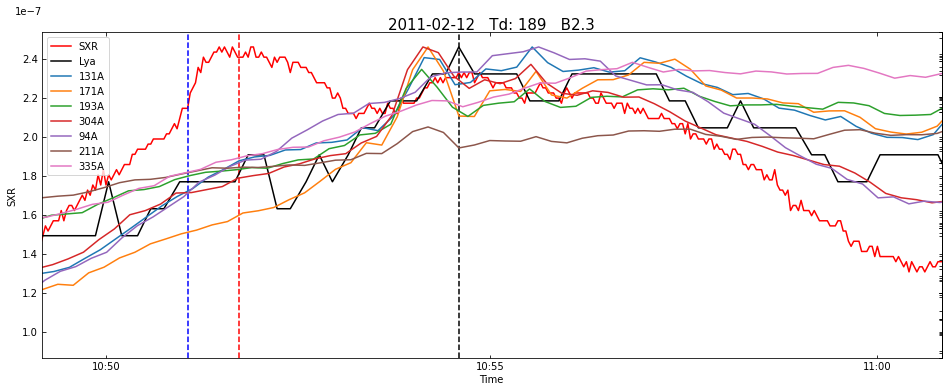

In [853]:
#绘制多坐标轴

# -*- coding: utf-8 -*-
from mpl_toolkits.axes_grid1 import host_subplot
import mpl_toolkits.axisartist as AA
import matplotlib.pyplot as plt
import xlrd
import datetime
import time
import xlrd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as spio   #用来读取sav格式
import csv 
import calendar
import matplotlib.dates as mdates
#from scipy import interpolate
import scipy
sheet_xrs_time = pd.read_csv('xrs_2010-2016_time.csv')
sheet_lya_time = pd.read_csv('lya_2010-2016_time_change_1.csv')
l_index=range(100)


list_time_lya_peak=[]
list_time_xrs_peak=[]
picture_name=[]#因中间少了0819数据，所以专门弄一个列表存图片名称，不然会串
picture_title=[]
for i in range(len(sheet_lya_time['DATE'])):
    a=sheet_lya_time['DATE'][i].split('-')[0]+sheet_lya_time['DATE'][i].split('-')[1]+sheet_lya_time['DATE'][i].split('-')[2]
    if(a=='20150819'):#中断点，不记录
        print('20150819跳过数据')
        continue
    
    list_time_lya_peak.append(int(sheet_lya_time['PEAKT'][i][0:2])*3600+int(sheet_lya_time['PEAKT'][i][3:5])*60+int(sheet_lya_time['PEAKT'][i][6:8]))
    a=int(sheet_lya_time['PEAKT'][i][0:2])*3600+int(sheet_lya_time['PEAKT'][i][3:5])*60+int(sheet_lya_time['PEAKT'][i][6:8])
    list_time_xrs_peak.append(a-int(sheet_lya_time['T_D'][i]))
    picture_name.append(sheet_lya_time['DATE'][i]+'  '+sheet_lya_time['CLASS'][i])
    picture_title.append(sheet_lya_time['DATE'][i]+'   Td: '+str(sheet_lya_time['T_D'][i])+'   '+sheet_lya_time['CLASS'][i])


   
    
sheet_index=[]   #差分结果峰值的位置记录
#for i in range(99):
    #sheet_index.append(sheet3_x_diff[:x_num_list[i]-c][i].idxmax()) 
    #sheet_index.append(sheet3_x_diff[2000:x_num_list[i]-c][i].idxmax()) #往前取一点区间
sheet3_diff_time = pd.DataFrame() #记录导数峰值的时间



i=11
print('第',i,'幅图')


fig = plt.figure(figsize=(20,6))

host = host_subplot(111, axes_class=AA.Axes)
plt.subplots_adjust(right=0.75)

par1 = host.twinx()
par2 = host.twinx()
par3 = host.twinx()

par4 = host.twinx()
par5 = host.twinx()
par6 = host.twinx()
par7 = host.twinx()
par8 = host.twinx()
par9 = host.twinx()
par10 = host.twinx()
par11 = host.twinx()
par12= host.twinx()
#x_num_list是图像的截止数据的位置索引，大概是峰值后一小时
if(x_num_list[i]-4000>=0) and(lya_num_list[i]-700>=0): 
    c=x_num_list[i]-4000 #大致往前推两个小时，作为坐标轴开始
    d=lya_num_list[i]-700
    if (x_num_list[i]>=40000):#防止有截止区间是原数据末尾的
        sheet_index.append(sheet3_x_diff[2000:x_num_list[i]-c][i].idxmax()) #往前取一点区间
    else:
        sheet_index.append(sheet3_x_diff[2000:x_num_list[i]-c-1500][i].idxmax()) #往前取一点区间
        #2000和1500是为了缩小寻找峰值的区间范围，标峰值精确度更高
else:
    c=0
    d=0
    sheet_index.append(sheet3_x_diff[:x_num_list[i]-c-1500][i].idxmax()) 
#print(c)

#sheet_index.append(sheet3_x_diff[:x_num_list[i]-c][i].idxmax()) 

#sheet_index.append(sheet3_x_diff[2000:x_num_list[i]-c][i].idxmax()) #往前取一点区间


time1_1=sheet3_x_time[c:x_num_list[i]][i] #约2s的分辨率
time2_1=sheet3_lya_time[d:lya_num_list[i]][i] #约2s的分辨率
time_smooth=sheet3_x_time[c:x_num_list[i]][i] #约2s的分辨率
time_diff=sheet3_x_time[c:x_num_list[i]][i] #约2s的分辨率

if (i==38):#部分峰值校正
    sheet_index[i]=sheet_index[i]+1275

if (i==62):#部分峰值校正
    sheet_index[i]=sheet_index[i]-705


#sheet3_diff_time.loc[1,0]=time_diff[c+int(sheet_index[i])]
#sheet3_diff_time.loc[2,1]=picture_title[i]
#设置坐标轴摆放位置和距离
#offset = 60
#new_fixed_axis = par2.get_grid_helper().new_fixed_axis
#par2.axis["right"] = new_fixed_axis(loc="right",axes=par2,offset=(offset, 0))
#par2.axis["right"].toggle(all=True)

##offset = 120
#new_fixed_axis = par3.get_grid_helper().new_fixed_axis
#par3.axis["right"] = new_fixed_axis(loc="right",axes=par3, offset=(offset, 0))
#par3.axis["right"].toggle(all=True)
list_time_x=list(time1_1)
time_str=[]
time_str_1=[]
for j in range(len(time1_1)):
    time_str.append(str(datetime.timedelta(seconds=list_time_x[j]))[0:8])
    time_str_1.append(str(datetime.timedelta(seconds=list_time_x[j]))[0:5])

host.set_xlabel("Time")
host.set_ylabel("SXR")
par1.set_ylabel("Lya")
par2.set_ylabel("SXR_deri")
par3.set_ylabel("SXR_smooth")


#图例
p1= host.plot(time1_1,sheet3_x_value[c:x_num_list[i]][i],color='r',label="SXR")
plt.axvline(list_time_xrs_peak[i],color='r',linestyle='--')
p2= par1.plot(time2_1,sheet3_lya_value[d:lya_num_list[i]][i],color='k',label="Lya")
plt.axvline(list_time_lya_peak[i]-18,color='k',linestyle='--')


#p3= par2.plot(time_diff,sheet3_x_diff[:x_num_list[i]-c][i],'s',markersize=2,label="SXR_deri")
plt.axvline(time_diff[c+int(sheet_index[0])],color='blue',linestyle='--')
#p4= par3.plot(time_smooth,sheet3_x_smooth[:x_num_list[i]-c][i],color='blue',label="SXR_smooth")
plt.title(picture_title[i],va = 'center',size=15)

p5= par4.plot(time_131A,data_131A,label="131A")
p6= par5.plot(time_171A,data_171A,label="171A")
p7= par6.plot(time_193A,data_193A,label="193A")
p8= par7.plot(time_304A,data_304A,label="304A")
p9= par8.plot(time_94A,data_94A,label="94A")
p10= par9.plot(time_211A,data_211A,label="211A")
p11= par10.plot(time_335A,data_335A,label="335A")
#p12= par11.plot(time_1600A,data_1600A,label="1600A")
#p13= par12.plot(time_1700A,data_1700A,label="1700A")
#locs, labels = xticks() 

#绘制横轴刻度
#list_b=['10:00','10:10','10:20','10:30','10:40','10:50','11:00']
#list_b=['22:00','22:02','22:04','22:06','22:08','22:10','22:12','22:14','22:16','22:18','22:20']
#list_b=['1:30','1:31','1:32','1:33','1:34','1:35','1:36']
list_b=['10:30','10:35','10:40','10:45','10:50','10:55','11:00','11:05','11:10','11:15','11:20']
list_a=[list_time_x[time_str_1.index(i)] for i in list_b] #把整刻时间索引找到，标记
plt.xticks(list_a,list_b,fontsize='20') 
#指定X轴的以日期格式（带小时）显示

##p9= par8.plot(time_94A,data_94A,color='b',label="94A")
#范围
#par1.set_ylim(0, 4*10**(-7))
#par2.set_ylim(100, 160)
#par3.set_ylim(1, 5)
#plt.axvline(37200,color='k',linestyle='--')
#host.set_xlim(list_time_x[time_str_1.index('1:00')]-100,list_time_x[time_str_1.index('2:00')]+100)
#host.set_xlim(list_time_x[time_str_1.index('1:15')]-100,list_time_x[time_str_1.index('1:45')]+100)
host.set_xlim(list_time_x[time_str_1.index('10:50')]-50,list_time_x[time_str_1.index('11:00')]+50)
y_min,ymax=host.set_ylim()
par3.set_ylim(y_min,ymax)


host.legend(loc="upper left")

#host.axis["left"].label.set_color(p1.get_color())
#par1.axis["right"].label.set_color(p2.get_color())
#par2.axis["right"].label.set_color(p3.get_color())

#plt.draw()
#plt.savefig('/home/tzy/Desktop/python_text/curve_new/'+picture_name[i]+'.png', format='png', bbox_inches='tight',dpi=600)
plt.show()

20150819跳过数据
第 11 幅图


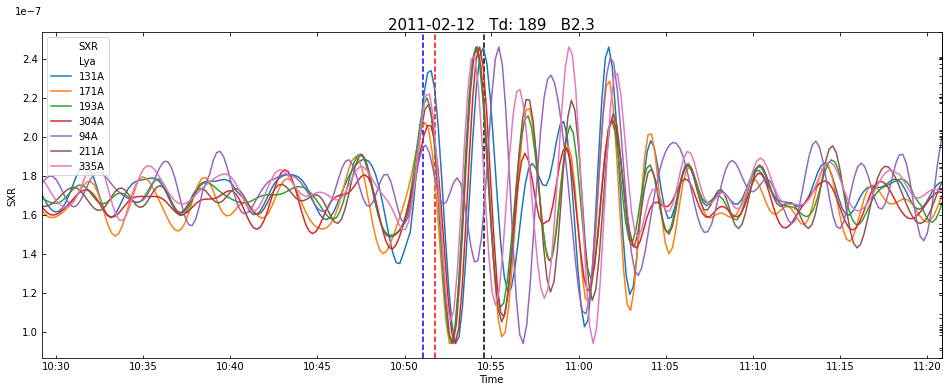

In [848]:
#绘制多坐标轴

# -*- coding: utf-8 -*-
from mpl_toolkits.axes_grid1 import host_subplot
import mpl_toolkits.axisartist as AA
import matplotlib.pyplot as plt
import xlrd
import datetime
import time
import xlrd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as spio   #用来读取sav格式
import csv 
import calendar
import matplotlib.dates as mdates
from scipy import signal
#from scipy import interpolate
import scipy
sheet_xrs_time = pd.read_csv('xrs_2010-2016_time.csv')
sheet_lya_time = pd.read_csv('lya_2010-2016_time_change_1.csv')
l_index=range(100)


list_time_lya_peak=[]
list_time_xrs_peak=[]
picture_name=[]#因中间少了0819数据，所以专门弄一个列表存图片名称，不然会串
picture_title=[]
for i in range(len(sheet_lya_time['DATE'])):
    a=sheet_lya_time['DATE'][i].split('-')[0]+sheet_lya_time['DATE'][i].split('-')[1]+sheet_lya_time['DATE'][i].split('-')[2]
    if(a=='20150819'):#中断点，不记录
        print('20150819跳过数据')
        continue
    
    list_time_lya_peak.append(int(sheet_lya_time['PEAKT'][i][0:2])*3600+int(sheet_lya_time['PEAKT'][i][3:5])*60+int(sheet_lya_time['PEAKT'][i][6:8]))
    a=int(sheet_lya_time['PEAKT'][i][0:2])*3600+int(sheet_lya_time['PEAKT'][i][3:5])*60+int(sheet_lya_time['PEAKT'][i][6:8])
    list_time_xrs_peak.append(a-int(sheet_lya_time['T_D'][i]))
    picture_name.append(sheet_lya_time['DATE'][i]+'  '+sheet_lya_time['CLASS'][i])
    picture_title.append(sheet_lya_time['DATE'][i]+'   Td: '+str(sheet_lya_time['T_D'][i])+'   '+sheet_lya_time['CLASS'][i])


   
    
sheet_index=[]   #差分结果峰值的位置记录
#for i in range(99):
    #sheet_index.append(sheet3_x_diff[:x_num_list[i]-c][i].idxmax()) 
    #sheet_index.append(sheet3_x_diff[2000:x_num_list[i]-c][i].idxmax()) #往前取一点区间
sheet3_diff_time = pd.DataFrame() #记录导数峰值的时间



i=11
print('第',i,'幅图')


fig = plt.figure(figsize=(20,6))

host = host_subplot(111, axes_class=AA.Axes)
plt.subplots_adjust(right=0.75)

par1 = host.twinx()
par2 = host.twinx()
par3 = host.twinx()

par4 = host.twinx()
par5 = host.twinx()
par6 = host.twinx()
par7 = host.twinx()
par8 = host.twinx()
par9 = host.twinx()
par10 = host.twinx()
par11 = host.twinx()
par12= host.twinx()
par13= host.twinx()
#x_num_list是图像的截止数据的位置索引，大概是峰值后一小时
if(x_num_list[i]-4000>=0) and(lya_num_list[i]-700>=0): 
    c=x_num_list[i]-4000 #大致往前推两个小时，作为坐标轴开始
    d=lya_num_list[i]-700
    if (x_num_list[i]>=40000):#防止有截止区间是原数据末尾的
        sheet_index.append(sheet3_x_diff[2000:x_num_list[i]-c][i].idxmax()) #往前取一点区间
    else:
        sheet_index.append(sheet3_x_diff[2000:x_num_list[i]-c-1500][i].idxmax()) #往前取一点区间
        #2000和1500是为了缩小寻找峰值的区间范围，标峰值精确度更高
else:
    c=0
    d=0
    sheet_index.append(sheet3_x_diff[:x_num_list[i]-c-1500][i].idxmax()) 
#print(c)

#sheet_index.append(sheet3_x_diff[:x_num_list[i]-c][i].idxmax()) 

#sheet_index.append(sheet3_x_diff[2000:x_num_list[i]-c][i].idxmax()) #往前取一点区间


time1_1=sheet3_x_time[c:x_num_list[i]][i] #约2s的分辨率
time2_1=sheet3_lya_time[d:lya_num_list[i]][i] #约2s的分辨率
time_smooth=sheet3_x_time[c:x_num_list[i]][i] #约2s的分辨率
time_diff=sheet3_x_time[c:x_num_list[i]][i] #约2s的分辨率

if (i==38):#部分峰值校正
    sheet_index[i]=sheet_index[i]+1275

if (i==62):#部分峰值校正
    sheet_index[i]=sheet_index[i]-705


#sheet3_diff_time.loc[1,0]=time_diff[c+int(sheet_index[i])]
#sheet3_diff_time.loc[2,1]=picture_title[i]
#设置坐标轴摆放位置和距离
#offset = 60
#new_fixed_axis = par2.get_grid_helper().new_fixed_axis
#par2.axis["right"] = new_fixed_axis(loc="right",axes=par2,offset=(offset, 0))
#par2.axis["right"].toggle(all=True)

##offset = 120
#new_fixed_axis = par3.get_grid_helper().new_fixed_axis
#par3.axis["right"] = new_fixed_axis(loc="right",axes=par3, offset=(offset, 0))
#par3.axis["right"].toggle(all=True)
list_time_x=list(time1_1)
time_str=[]
time_str_1=[]
for j in range(len(time1_1)):
    time_str.append(str(datetime.timedelta(seconds=list_time_x[j]))[0:8])
    time_str_1.append(str(datetime.timedelta(seconds=list_time_x[j]))[0:5])

host.set_xlabel("Time")
host.set_ylabel("SXR")
par1.set_ylabel("Lya")
par2.set_ylabel("SXR_deri")
par3.set_ylabel("SXR_smooth")


#图例
p1= host.plot(time1_1,sheet3_x_value[c:x_num_list[i]][i],color='r',label="SXR",alpha=0)
plt.axvline(list_time_xrs_peak[i],color='r',linestyle='--')
p2= par1.plot(time2_1,sheet3_lya_value[d:lya_num_list[i]][i],color='k',label="Lya",alpha=0)
plt.axvline(list_time_lya_peak[i],color='k',linestyle='--')


#p3= par2.plot(time_diff,sheet3_x_diff[:x_num_list[i]-c][i],'s',markersize=2,label="SXR_deri")
plt.axvline(time_diff[c+int(sheet_index[0])],color='blue',linestyle='--')
#p4= par3.plot(time_smooth,sheet3_x_smooth[:x_num_list[i]-c][i],color='blue',label="SXR_smooth")
plt.title(picture_title[i],va = 'center',size=15)

#b_1, a_1 = signal.butter(8, 0.1, 'highpass')  #2*x/(1/12)=0.15,T=1/x
#b_1, a_1 = signal.butter(8, 0.08, 'lowpass') 
b_1, a_1 = signal.butter(8, [0.1,0.2],'bandpass')##
#b_1, a_1 = signal.butter(8, [0.05,0.08],'bandpass') 
filtedData_131A = signal.filtfilt(b_1, a_1, data_131A)       #data为要过滤的信号
filtedData_171A = signal.filtfilt(b_1, a_1, data_171A)       #data为要过滤的信号
filtedData_193A = signal.filtfilt(b_1, a_1, data_193A)       #data为要过滤的信号
filtedData_304A = signal.filtfilt(b_1, a_1, data_304A)       #data为要过滤的信号
filtedData_94A = signal.filtfilt(b_1, a_1, data_94A)       #data为要过滤的信号
filtedData_211A = signal.filtfilt(b_1, a_1, data_211A)       #data为要过滤的信号
filtedData_335A = signal.filtfilt(b_1, a_1, data_335A)       #data为要过滤的信号
filtedData_1600A = signal.filtfilt(b_1, a_1, data_1600A)       #data为要过滤的信号

p5= par4.plot(time_131A,filtedData_131A,label="131A")
p6= par5.plot(time_171A,filtedData_171A,label="171A")
p7= par6.plot(time_193A,filtedData_193A,label="193A")
p8= par7.plot(time_304A,filtedData_304A,label="304A")
p9= par8.plot(time_94A,filtedData_94A,label="94A")
p10= par9.plot(time_211A,filtedData_211A,label="211A")
p11= par10.plot(time_335A,filtedData_335A,label="335A")
#p12= par11.plot(time_1600A,filtedData_1600A,label="1600A")


#p13= par12.plot(time_1700A,data_1700A,label="1700A")


#p14= par13.plot(time_304A,filtedData*2,label="filter")
#locs, labels = xticks() 

#绘制横轴刻度
#list_b=['10:00','10:10','10:20','10:30','10:40','10:50','11:00']
#list_b=['22:00','22:02','22:04','22:06','22:08','22:10','22:12','22:14','22:16','22:18','22:20']
#list_b=['10:25','10:26','10:27','10:28','10:29','10:30']
#list_b=['10:00','10:05','10:10','10:15','10:20','10:25','10:30']
#list_b=['1:12','1:14','1:16','1:18','1:20','1:22','1:24','1:26','1:28','1:30','1:32','1:34','1:36','1:38','1:40','1:42','1:44','1:46']
#list_b=['1:00','1:16','1:20','1:24','1:28','1:32','1:36','1:40','1:44','1:48','1:52','1:56']
#list_b=['12:30','12:35','12:40','12:45','12:50','12:55','13:00','13:05','13:10','13:15','13:20']
list_b=['10:30','10:35','10:40','10:45','10:50','10:55','11:00','11:05','11:10','11:15','11:20']
list_a=[list_time_x[time_str_1.index(i)] for i in list_b] #把整刻时间索引找到，标记
plt.xticks(list_a,list_b,fontsize='20') 
#指定X轴的以日期格式（带小时）显示

##p9= par8.plot(time_94A,data_94A,color='b',label="94A")
#范围
#par1.set_ylim(0, 4*10**(-7))
#par2.set_ylim(100, 160)
#par3.set_ylim(1, 5)
#plt.axvline(37200,color='k',linestyle='--')
#host.set_xlim(list_time_x[time_str_1.index('1:00')]-100,list_time_x[time_str_1.index('2:00')]+100)
#host.set_xlim(list_time_x[time_str_1.index('1:15')]-100,list_time_x[time_str_1.index('1:45')]+100)
host.set_xlim(list_time_x[time_str_1.index('10:30')]-50,list_time_x[time_str_1.index('11:20')]+50)
y_min,ymax=host.set_ylim()
par3.set_ylim(y_min,ymax)


host.legend(loc="upper left")

#host.axis["left"].label.set_color(p1.get_color())
#par1.axis["right"].label.set_color(p2.get_color())
#par2.axis["right"].label.set_color(p3.get_color())

#plt.draw()
#plt.savefig('/home/tzy/Desktop/python_text/curve_new/'+picture_name[i]+'.png', format='png', bbox_inches='tight',dpi=600)
plt.show()

In [ ]:
time_str=[]
time_str_1=[]
for i in range(len(time1_1)):
    time_str.append(str(datetime.timedelta(seconds=list_time_x[i]))[0:8])
    time_str_1.append(str(datetime.timedelta(seconds=list_time_x[i]))[0:5])

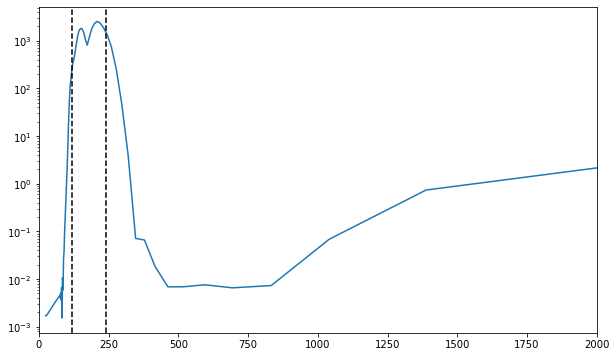

In [846]:
plt.figure(figsize=(10,6))
f, Pxx_spec = signal.welch(filtedData_131A, 1/12, 'flattop', len(filtedData_131A), scaling='spectrum')
plt.semilogy(1/f[1:], np.sqrt(Pxx_spec)[1:])
plt.axvline(120,color='k',linestyle='--')
plt.axvline(240,color='k',linestyle='--')
plt.xlim(0,2000)
plt.show()


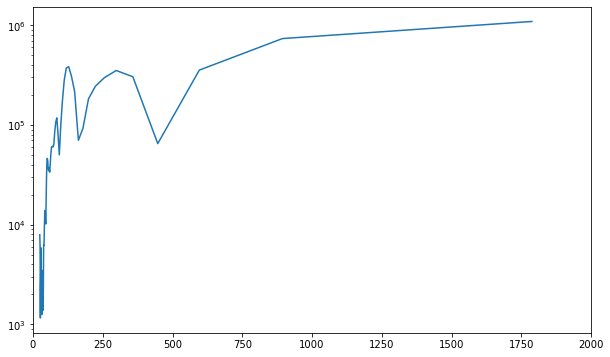

In [640]:
plt.figure(figsize=(10,6))
f, Pxx_spec = signal.welch(data_1700A, 1/12, 'flattop', len(data_1600A), scaling='spectrum')
plt.semilogy(1/f[1:], np.sqrt(Pxx_spec)[1:])
#plt.axvline(120,color='k',linestyle='--')
#plt.axvline(240,color='k',linestyle='--')
plt.xlim(0,2000)
plt.show()


<ipython-input-847-c48228b54b71>:15: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(times_1, freqs,  np.log10(Sxx/10), cmap='inferno')


(37901.3710000515, 40701.64499998093)

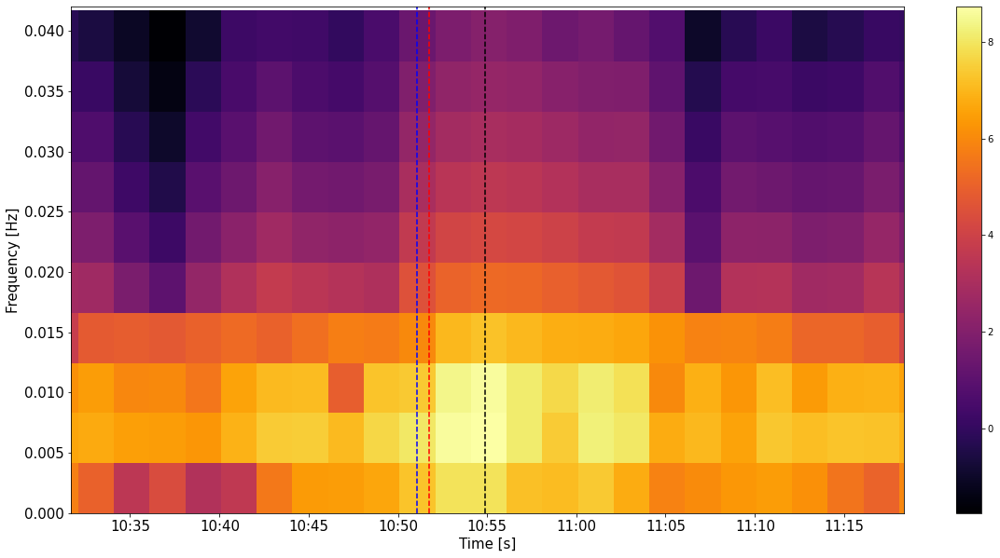

In [847]:
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
import pandas as pd
from matplotlib import cm

rate=1/12
Block_size=20
freqs, times, Sxx = signal.spectrogram(np.array(filtedData_304A), fs=rate, nfft=Block_size,window='hanning',nperseg=Block_size, 
                                       noverlap=0.5*Block_size,detrend=False, scaling='spectrum')
                                      
                                      
plt.figure(figsize=(20,10))
times_1=times+time_304A[0]
plt.pcolormesh(times_1, freqs,  np.log10(Sxx/10), cmap='inferno')
#plt.clim(70,150)
plt.ylim(0,0.042)
plt.colorbar()
plt.ylabel('Frequency [Hz]',fontsize='15')
plt.xlabel('Time [s]',fontsize='15');
#plt.colorbar(10,-10)
plt.axvline(list_time_xrs_peak[i],color='r',linestyle='--')
plt.axvline(time_diff[c+int(sheet_index[0])],color='blue',linestyle='--')
plt.axvline(list_time_lya_peak[i],color='k',linestyle='--')
list_b=['10:30','10:35','10:40','10:45','10:50','10:55','11:00','11:05','11:10','11:15','11:20']
list_a=[list_time_x[time_str_1.index(i)] for i in list_b] #把整刻时间索引找到，标记
plt.xticks(list_a,list_b,fontsize='15') 
plt.yticks(fontsize='15') 
plt.xlim(list_time_x[time_str_1.index('10:30')]+100,list_time_x[time_str_1.index('11:20')]-100)


<ipython-input-598-30aff546a669>:12: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(t, f, Sxx)


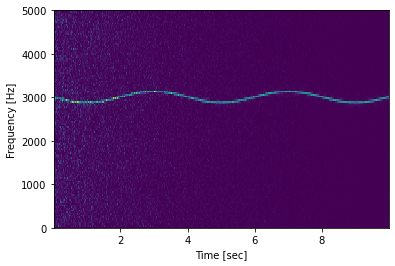

In [598]:
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
import pandas as pd
from matplotlib import cm

rate=1/12
Block_size=20
freqs, times, Sxx = signal.spectrogram(np.array(filtedData_304A), fs=rate, nfft=Block_size,window='hanning',nperseg=Block_size, 
                                       noverlap=0.5*Block_size,detrend=False, scaling='spectrum')
                                      
                                      
plt.figure(figsize=(20,10))
times_1=times+time_304A[0]
plt.pcolormesh(times_1, freqs,  np.log10(Sxx/10), cmap='inferno')
#plt.clim(70,150)
plt.ylim(0,0.042)
plt.colorbar()
plt.ylabel('Frequency [Hz]',fontsize='15')
plt.xlabel('Time [s]',fontsize='15');
#plt.colorbar(10,-10)
plt.axvline(list_time_xrs_peak[i],color='r',linestyle='--')
plt.axvline(time_diff[c+int(sheet_index[0])],color='blue',linestyle='--')
plt.axvline(list_time_lya_peak[i],color='k',linestyle='--')
list_b=['12:20','12:25','12:30','12:35','12:40','12:45','12:50','12:55','13:00','13:05','13:10','13:15','13:20']
list_a=[list_time_x[time_str_1.index(i)] for i in list_b] #把整刻时间索引找到，标记
plt.xticks(list_a,list_b,fontsize='15') 
plt.yticks(fontsize='15') 
plt.xlim(list_time_x[time_str_1.index('12:20')]+100,list_time_x[time_str_1.index('13:20')]-100)


In [604]:
x

array([-9.11551351,  0.33608018,  4.30840853, ...,  1.16401108,
       -5.14551658,  1.96153233])

20150819跳过数据
第 0 幅图


KeyError: 0

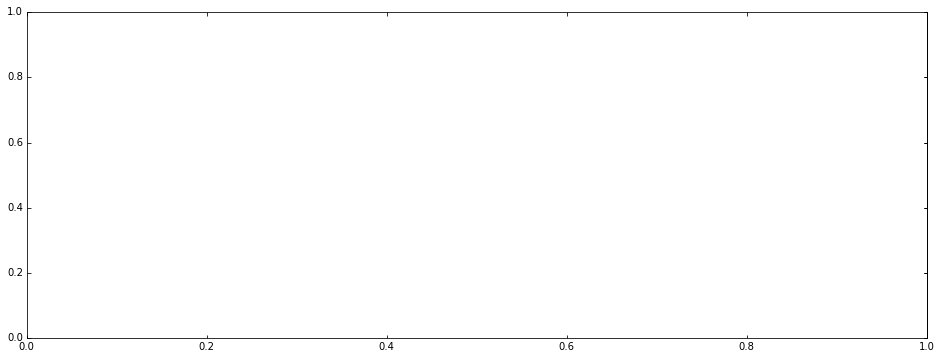

In [120]:
#绘制多坐标轴

# -*- coding: utf-8 -*-




from mpl_toolkits.axes_grid1 import host_subplot
import mpl_toolkits.axisartist as AA
import matplotlib.pyplot as plt
import xlrd
import datetime
import time
import xlrd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as spio   #用来读取sav格式
import numpy as np 
import csv 
#from scipy import interpolate
import scipy
sheet_xrs_time = pd.read_csv('xrs_2010-2016_time.csv')
sheet_lya_time = pd.read_csv('lya_2010-2016_time_change_1.csv')
l_index=range(100)


list_time_lya_peak=[]
list_time_xrs_peak=[]
picture_name=[]#因中间少了0819数据，所以专门弄一个列表存图片名称，不然会串
picture_title=[]
for i in range(len(sheet_lya_time['DATE'])):
    a=sheet_lya_time['DATE'][i].split('-')[0]+sheet_lya_time['DATE'][i].split('-')[1]+sheet_lya_time['DATE'][i].split('-')[2]
    if(a=='20150819'):#中断点，不记录
        print('20150819跳过数据')
        continue
    
    list_time_lya_peak.append(int(sheet_lya_time['PEAKT'][i][0:2])*3600+int(sheet_lya_time['PEAKT'][i][3:5])*60+int(sheet_lya_time['PEAKT'][i][6:8]))
    a=int(sheet_lya_time['PEAKT'][i][0:2])*3600+int(sheet_lya_time['PEAKT'][i][3:5])*60+int(sheet_lya_time['PEAKT'][i][6:8])
    list_time_xrs_peak.append(a-int(sheet_lya_time['T_D'][i]))
    picture_name.append(sheet_lya_time['DATE'][i]+'  '+sheet_lya_time['CLASS'][i])
    picture_title.append(sheet_lya_time['DATE'][i]+'   Td: '+str(sheet_lya_time['T_D'][i])+'   '+sheet_lya_time['CLASS'][i])


   
    
sheet_index=[]   #差分结果峰值的位置记录
#for i in range(99):
    #sheet_index.append(sheet3_x_diff[:x_num_list[i]-c][i].idxmax()) 
    #sheet_index.append(sheet3_x_diff[2000:x_num_list[i]-c][i].idxmax()) #往前取一点区间
sheet3_diff_time = pd.DataFrame() #记录导数峰值的时间
for i in range(99):
    print('第',i,'幅图')


    fig = plt.figure(figsize=(20,6))

    host = host_subplot(111, axes_class=AA.Axes)
    plt.subplots_adjust(right=0.75)

    par1 = host.twinx()
    par2 = host.twinx()
    par3 = host.twinx()

    #x_num_list是图像的截止数据的位置索引，大概是峰值后一小时
    if(x_num_list[i]-4000>=0) and(lya_num_list[i]-700>=0): 
        c=x_num_list[i]-4000 #大致往前推两个小时，作为坐标轴开始
        d=lya_num_list[i]-700
        if (x_num_list[i]>=40000):#防止有截止区间是原数据末尾的
            sheet_index.append(sheet3_x_diff[2000:x_num_list[i]-c][i].idxmax()) #往前取一点区间
        else:
            sheet_index.append(sheet3_x_diff[2000:x_num_list[i]-c-1500][i].idxmax()) #往前取一点区间
            #2000和1500是为了缩小寻找峰值的区间范围，标峰值精确度更高
    else:
        c=0
        d=0
        sheet_index.append(sheet3_x_diff[:x_num_list[i]-c-1500][i].idxmax()) 
    #print(c)

    #sheet_index.append(sheet3_x_diff[:x_num_list[i]-c][i].idxmax()) 

    #sheet_index.append(sheet3_x_diff[2000:x_num_list[i]-c][i].idxmax()) #往前取一点区间
    
    
    time1_1=sheet3_x_time[c:x_num_list[i]][i] #约2s的分辨率
    time2_1=sheet3_lya_time[d:lya_num_list[i]][i] #约2s的分辨率
    time_smooth=sheet3_x_time[c:x_num_list[i]][i] #约2s的分辨率
    time_diff=sheet3_x_time[c:x_num_list[i]][i] #约2s的分辨率
    
    if (i==38):#部分峰值校正
        sheet_index[i]=sheet_index[i]+1275
     
    if (i==62):#部分峰值校正
        sheet_index[i]=sheet_index[i]-705
    
    
    sheet3_diff_time.loc[i,0]=time_diff[c+int(sheet_index[i])]
    sheet3_diff_time.loc[i,1]=picture_title[i]
    #设置坐标轴摆放位置和距离
    offset = 60
    new_fixed_axis = par2.get_grid_helper().new_fixed_axis
    par2.axis["right"] = new_fixed_axis(loc="right",axes=par2,offset=(offset, 0))
    par2.axis["right"].toggle(all=True)

    offset = 120
    new_fixed_axis = par3.get_grid_helper().new_fixed_axis
    par3.axis["right"] = new_fixed_axis(loc="right",axes=par3, offset=(offset, 0))
    par3.axis["right"].toggle(all=True)

    

    host.set_xlabel("Time")
    host.set_ylabel("SXR")
    par1.set_ylabel("Lya")
    par2.set_ylabel("SXR_deri")
    par3.set_ylabel("SXR_smooth")

    #图例
    p1= host.plot(time1_1,sheet3_x_value[c:x_num_list[i]][i],color='r',label="SXR")
    plt.axvline(list_time_xrs_peak[i],color='red',linestyle='--')
    p2= par1.plot(time2_1,sheet3_lya_value[d:lya_num_list[i]][i],color='k',label="Lya")
    plt.axvline(list_time_lya_peak[i],color='k',linestyle='--')
    p3= par2.plot(time_diff,sheet3_x_diff[:x_num_list[i]-c][i],'s',markersize=2,label="SXR_deri")
    plt.axvline(time_diff[c+int(sheet_index[i])],color='blue',linestyle='--')
    p4= par3.plot(time_smooth,sheet3_x_smooth[:x_num_list[i]-c][i],color='blue',label="SXR_smooth")
    plt.title(picture_title[i],va = 'center',size=15)
    
    #范围
    #par1.set_ylim(0, 4*10**(-7))
    #par2.set_ylim(100, 160)
    #par3.set_ylim(1, 5)
    
    #host.set_xlim(0,48)
    y_min,ymax=host.set_ylim()
    par3.set_ylim(y_min,ymax)
    

    host.legend(loc="upper left")

    #host.axis["left"].label.set_color(p1.get_color())
    #par1.axis["right"].label.set_color(p2.get_color())
    #par2.axis["right"].label.set_color(p3.get_color())
    
    #plt.draw()
    plt.savefig('/home/tzy/Desktop/python_text/curve_new/'+picture_name[i]+'.png', format='png', bbox_inches='tight',dpi=600)
    plt.show()

In [117]:
sheet3_diff_time.to_csv('x_time_diff.csv');

In [111]:
sheet3_diff_time

,0,1
0,17271.000,2010-04-09 Td: -233 B3.7
1,31547.000,2010-06-09 Td: 256 B2.5
2,19687.000,2010-07-31 Td: -57 B4.8
3,48125.355,2010-10-19 Td: -69 B5.1
4,63173.887,2010-10-23 Td: -236 B3.6
...,...,...
94,23134.087,2016-04-15 Td: 255 B7.7
95,14714.850,2016-04-26 Td: 4 B4.9
96,382.977,2016-04-27 Td: -15 B4.3
97,7247.890,2016-05-25 Td: -116 B3.8


from astropy.modeling import models, fitting
import numpy as np
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(15,6))
sheet3_x_diff
time_diff=sheet3_x_time[7000:][0] #约2s的分辨率
#plt.yscale("log")
plt.axvline(time_diff[sheet_index[0]],color='red',linestyle='--')
plt.plot(time_diff,sheet3_x_diff[7000:][0],'s',markersize=2.5)

for i in range(0,1):
    fig = plt.figure(figsize=(15,6))
    time1=sheet3_x_time[7000:][i] #约2s的分辨率
    plt.plot(time1,sheet3_x_value[7000:][i],color='r')
    plt.show()
    


In [116]:
#前一小时平均值减背景

# -*- coding: utf-8 -*-




from mpl_toolkits.axes_grid1 import host_subplot
import mpl_toolkits.axisartist as AA
import matplotlib.pyplot as plt
import xlrd
import datetime
import time
import xlrd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as spio   #用来读取sav格式
import numpy as np 
import csv 
#from scipy import interpolate
import scipy
sheet_xrs_time = pd.read_csv('xrs_2010-2016_time.csv')
sheet_lya_time = pd.read_csv('lya_2010-2016_time_change_1.csv')

for i in range(99):

    if(x_num_list[i]-4000>=0) and(lya_num_list[i]-700>=0): 
        c=x_num_list[i]-4000 #大致往前推两个小时，作为坐标轴开始
        d=lya_num_list[i]-700
    else:
        c=0
        d=0

    sheet3_x_value[c:][i]
    
    sheet3_lya_value[d:lya_num_list[i]][i]


,0,1
0,17271.000,2010-04-09 Td: -233 B3.7
1,31547.000,2010-06-09 Td: 256 B2.5
2,19687.000,2010-07-31 Td: -57 B4.8
3,48125.355,2010-10-19 Td: -69 B5.1
4,63173.887,2010-10-23 Td: -236 B3.6
...,...,...
94,23134.087,2016-04-15 Td: 255 B7.7
95,14714.850,2016-04-26 Td: 4 B4.9
96,382.977,2016-04-27 Td: -15 B4.3
97,7247.890,2016-05-25 Td: -116 B3.8


In [162]:
from astropy.modeling import models, fitting

In [25]:
sheet3_x_value[90:100][0]

90    3.961600e-08
91    3.961600e-08
92    4.218220e-08
93    4.218220e-08
94    3.961600e-08
95    3.704980e-08
96    3.961600e-08
97    3.961600e-08
98    4.218220e-08
99    3.961600e-08
Name: 0, dtype: float64

In [298]:
x_num_list

[10282,
 17299,
 11365,
 25270,
 32608,
 7468,
 31000,
 7237,
 18950,
 40258,
 39901,
 20940,
 7007,
 2649,
 39814,
 19298,
 42187,
 25587,
 34182,
 35628,
 27911,
 22295,
 9864,
 34296,
 35064,
 2462,
 42172,
 34812,
 10280,
 42164,
 22503,
 30200,
 19559,
 28899,
 8312,
 31683,
 11439,
 4196,
 42176,
 21065,
 19831,
 12668,
 40870,
 15286,
 26036,
 12694,
 36213,
 3492,
 24768,
 42113,
 10120,
 5639,
 24624,
 28574,
 36835,
 25596,
 38480,
 4984,
 32546,
 37496,
 30216,
 20251,
 30338,
 6590,
 41770,
 4743,
 34327,
 35755,
 14147,
 2016,
 24358,
 30426,
 2631,
 7886,
 29289,
 24799,
 10246,
 34914,
 12736,
 8225,
 22853,
 32704,
 5797,
 32480,
 23989,
 37438,
 4439,
 21612,
 30415,
 23138,
 7777,
 10858,
 15247,
 41750,
 13187,
 8992,
 1988,
 5300,
 22737]

20150819跳过数据


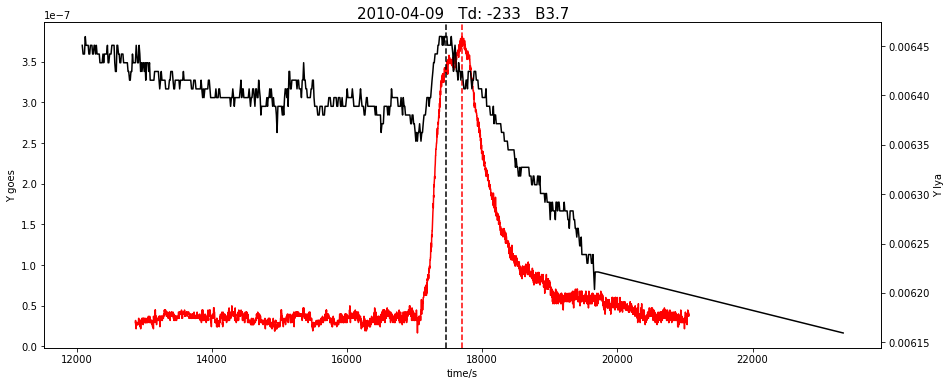

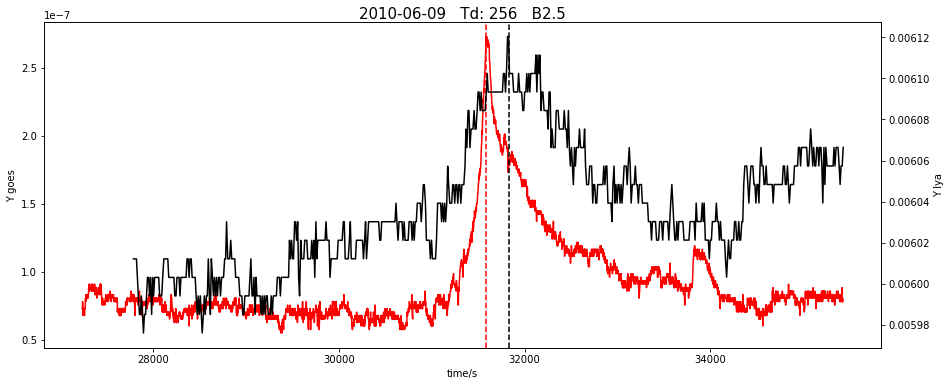

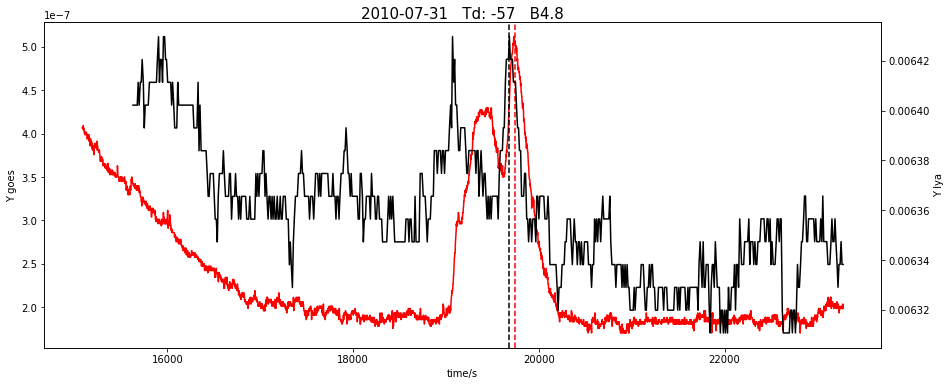

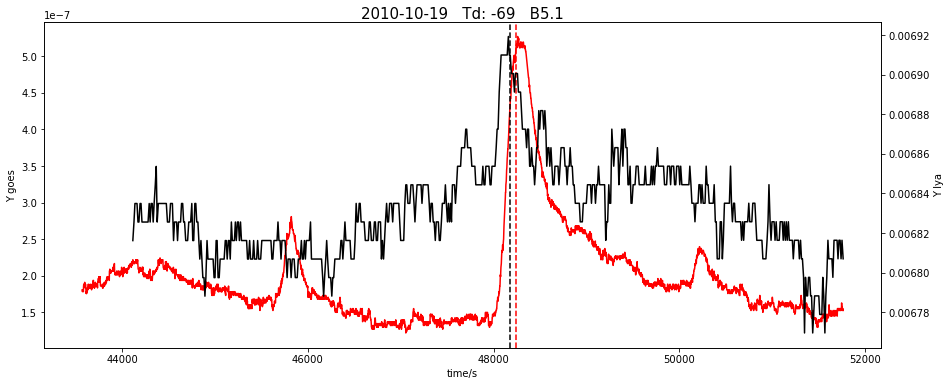

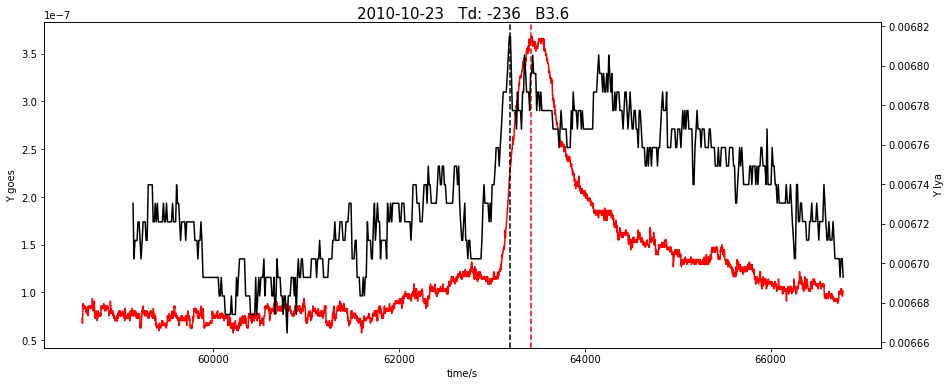

...

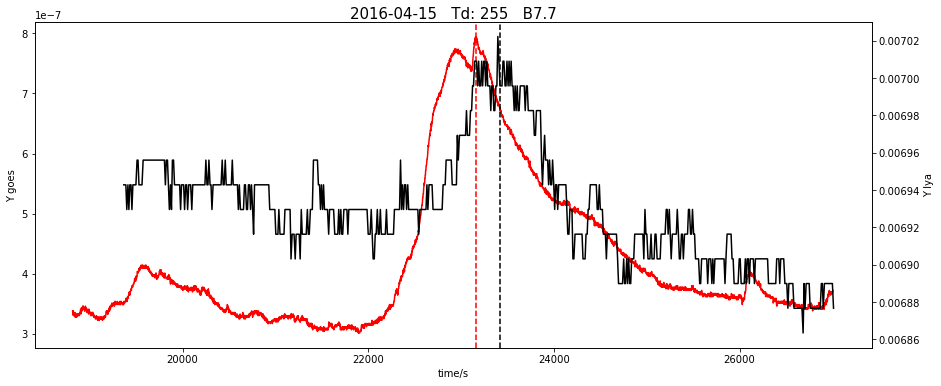

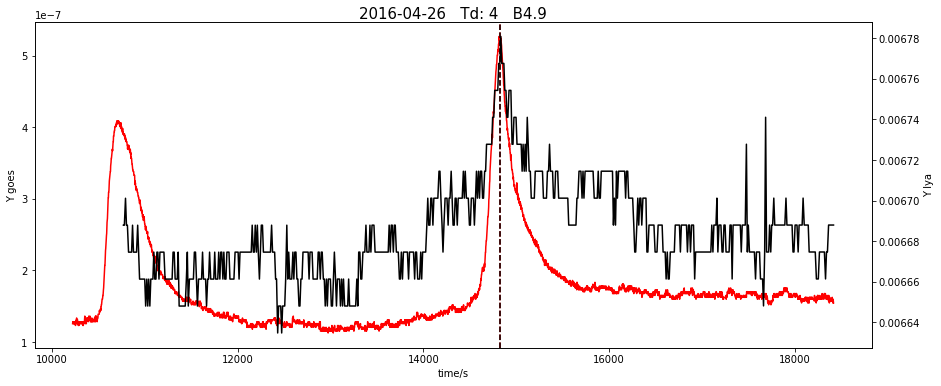

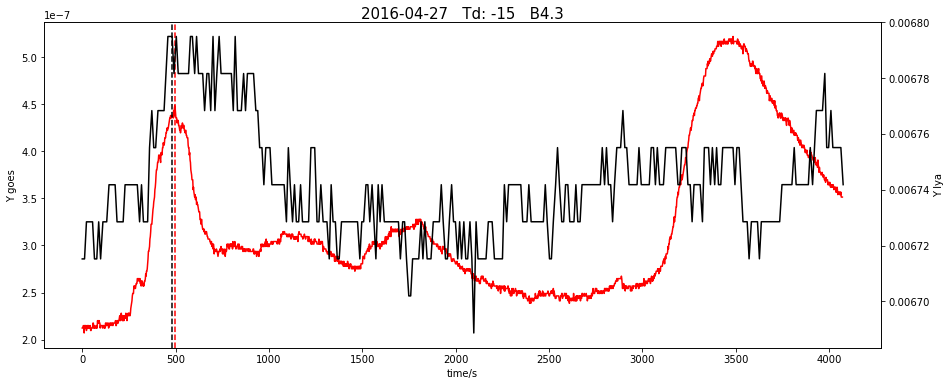

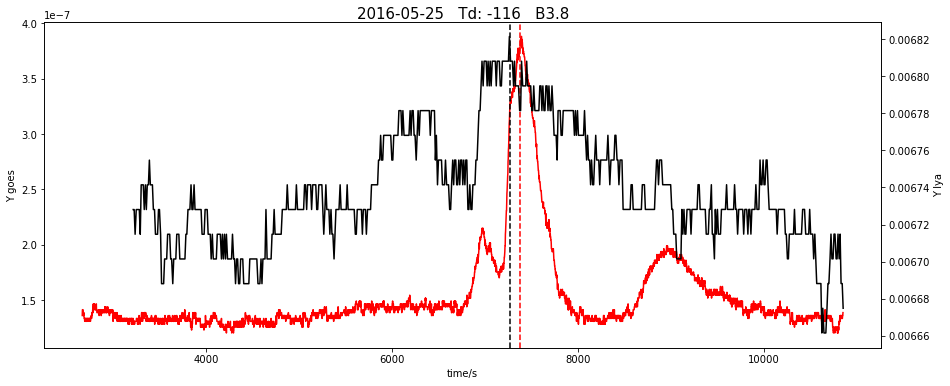

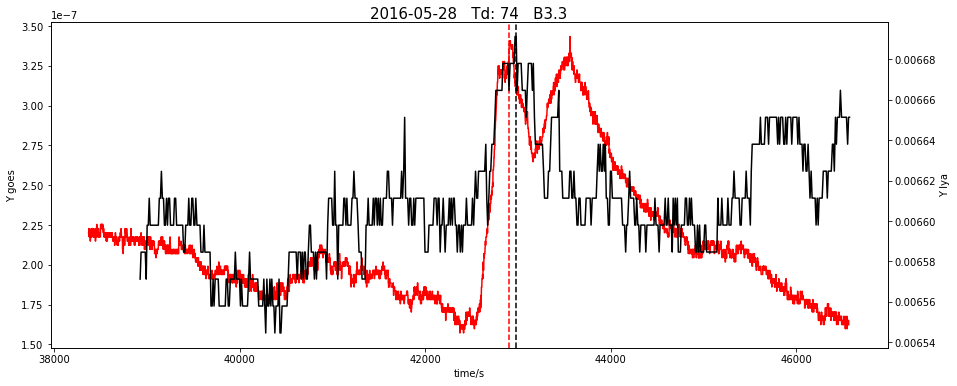

In [11]:
#绘图
import datetime
import time
import xlrd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as spio   #用来读取sav格式
import numpy as np 
import csv 
#from scipy import interpolate
import scipy
sheet_xrs_time = pd.read_csv('xrs_2010-2016_time.csv')
sheet_lya_time = pd.read_csv('lya_2010-2016_time_change_1.csv')
l_index=range(100)


list_time_lya_peak=[]
list_time_xrs_peak=[]
picture_name=[]#因中间少了0819数据，所以专门弄一个列表存图片名称，不然会串
picture_title=[]
for i in range(len(sheet_lya_time['DATE'])):
    a=sheet_lya_time['DATE'][i].split('-')[0]+sheet_lya_time['DATE'][i].split('-')[1]+sheet_lya_time['DATE'][i].split('-')[2]
    if(a=='20150819'):#中断点，不记录
        print('20150819跳过数据')
        continue
    
    list_time_lya_peak.append(int(sheet_lya_time['PEAKT'][i][0:2])*3600+int(sheet_lya_time['PEAKT'][i][3:5])*60+int(sheet_lya_time['PEAKT'][i][6:8]))
    a=int(sheet_lya_time['PEAKT'][i][0:2])*3600+int(sheet_lya_time['PEAKT'][i][3:5])*60+int(sheet_lya_time['PEAKT'][i][6:8])
    list_time_xrs_peak.append(a-int(sheet_lya_time['T_D'][i]))
    picture_name.append(sheet_lya_time['DATE'][i]+'  '+sheet_lya_time['CLASS'][i])
    picture_title.append(sheet_lya_time['DATE'][i]+'   Td: '+str(sheet_lya_time['T_D'][i])+'   '+sheet_lya_time['CLASS'][i])


#原始数据绘制
for i in range(0,99):
    fig = plt.figure(figsize=(15,6))
    ax1 = fig.add_subplot(111)
    if(x_num_list[i]-4000>=0) and(lya_num_list[i]-700>=0): 
        c=x_num_list[i]-4000 #大致往前推两个小时，作为坐标轴开始
        d=lya_num_list[i]-700
        time1=sheet3_x_time[c:][i] #约2s的分辨率
        time2=sheet3_lya_time[d:][i] #约10s的分辨率
        ax2 = ax1.twinx()

        ax1.set_ylabel('Y goes');

        ax2.set_ylabel('Y lya');
        ax1.set_xlabel('time/s');
        
        ax1.plot(time1,sheet3_x_value[c:][i],color='r',label="xrs")
        plt.axvline(list_time_xrs_peak[i],color='red',linestyle='--')
        ax2.plot(time2,sheet3_lya_value[d:][i],color='k',label="Lya")
        plt.axvline(list_time_lya_peak[i],color='k',linestyle='--')
        plt.title(picture_title[i],va = 'center',size=15)
        plt.savefig('/home/tzy/Desktop/python_text/curve_png_new/'+picture_name[i]+'.png', format='png', bbox_inches='tight',dpi=600)
        
        plt.show()
    else:
        time1=sheet3_x_time[:][i] #约2s的分辨率
        time2=sheet3_lya_time[:][i] #约10s的分辨率
        ax2 = ax1.twinx()

        ax1.set_ylabel('Y goes');
        ax2.set_ylabel('Y lya');
        ax1.set_xlabel('time/s');
        ax1.plot(time1,sheet3_x_value[:][i],color='r',label="xrs")
        plt.axvline(list_time_xrs_peak[i],color='red',linestyle='--')
        ax2.plot(time2,sheet3_lya_value[:][i],color='k',label="Lya")
        plt.axvline(list_time_lya_peak[i],color='k',linestyle='--')
        plt.title(picture_title[i],va = 'center',size=15)
        plt.savefig('/home/tzy/Desktop/python_text/curve_png_new/'+picture_name[i]+'.png', format='png', bbox_inches='tight',dpi=600)
        plt.show()

20150819跳过数据


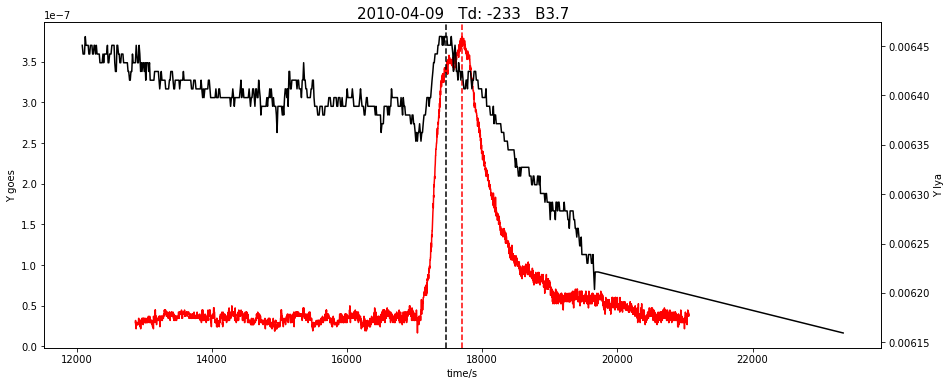

0


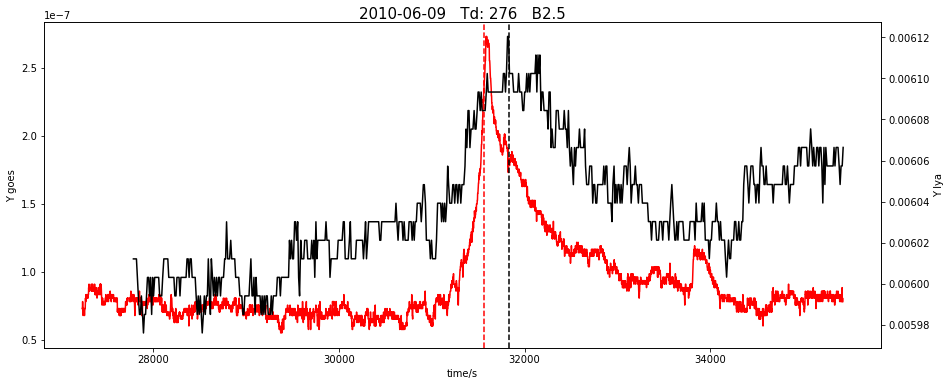

1


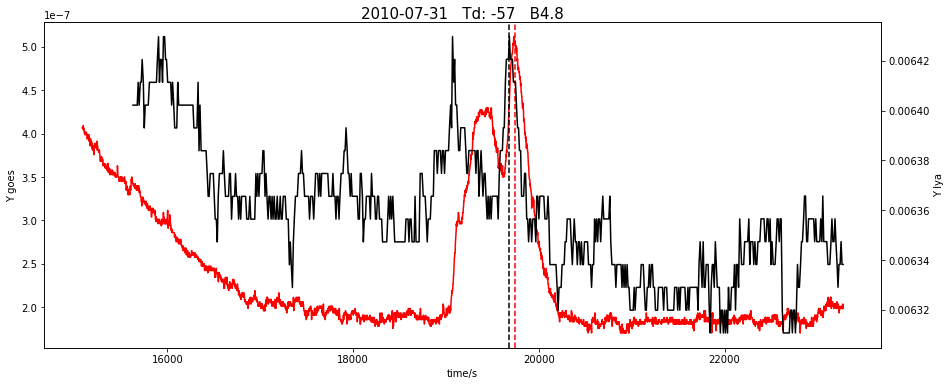

2


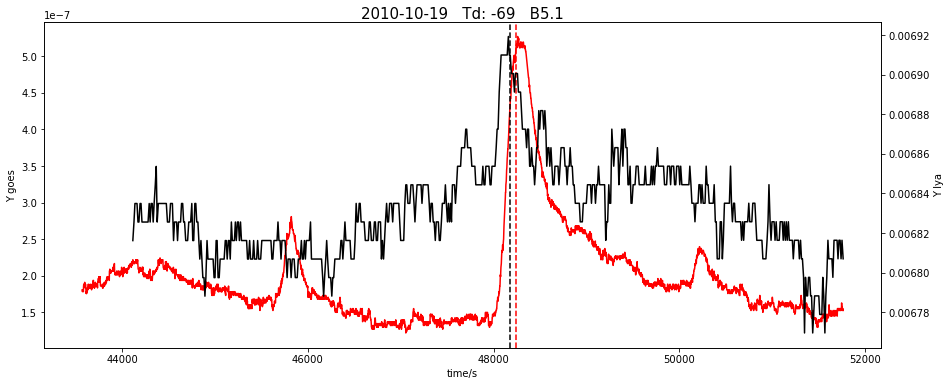

3


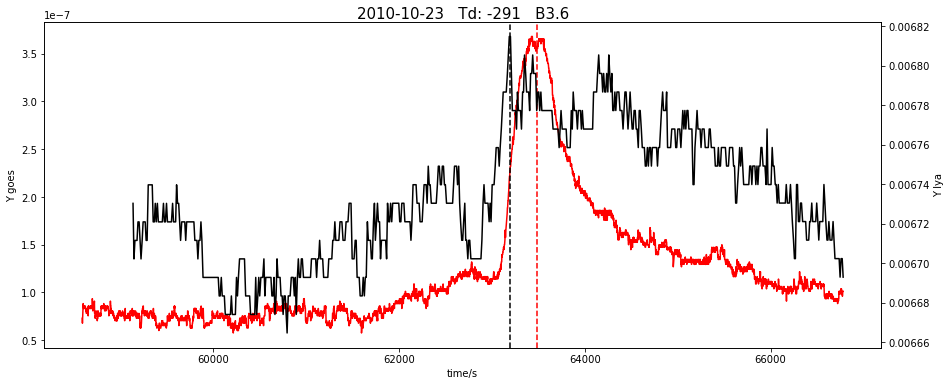

4


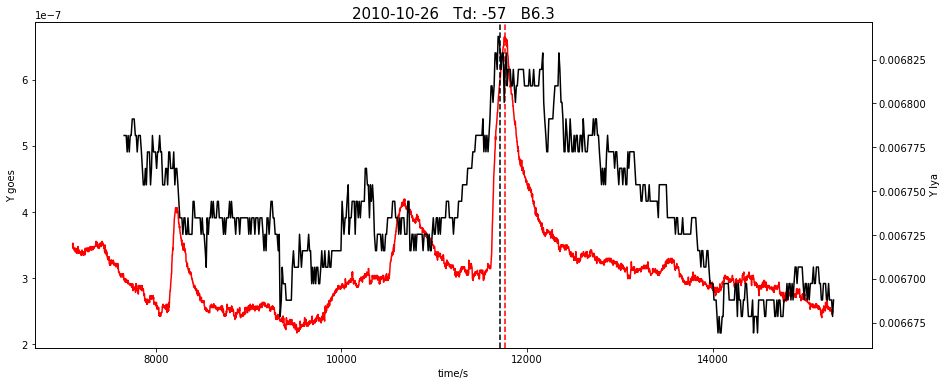

5


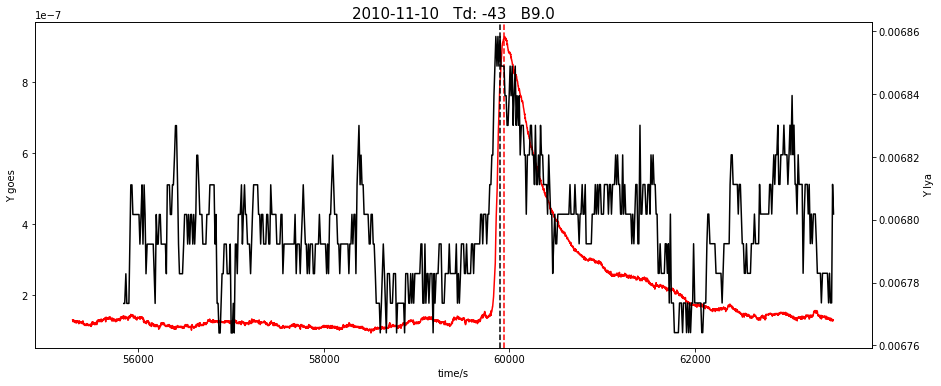

6


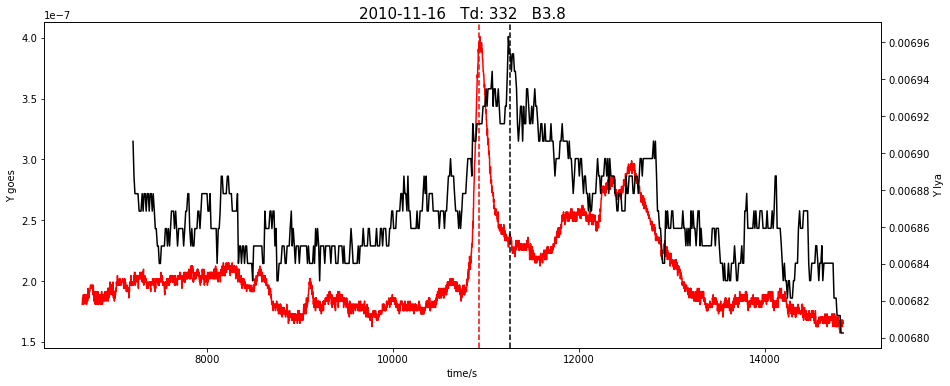

7


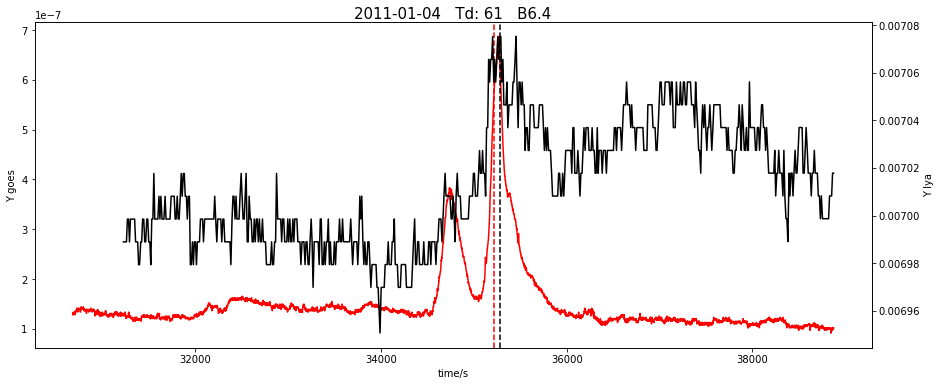

8


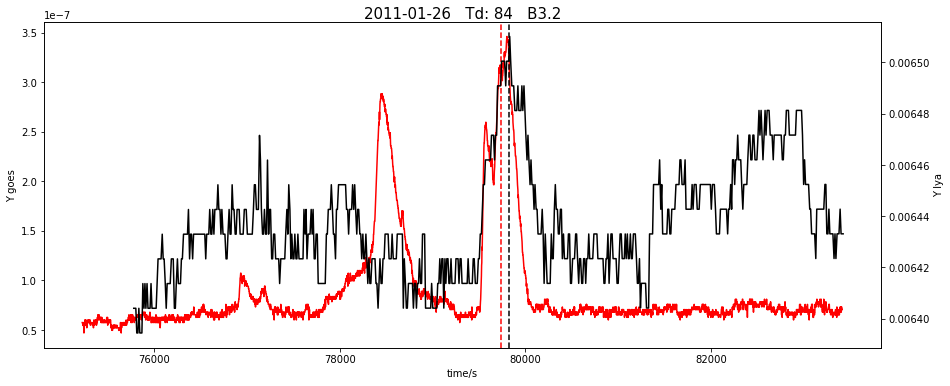

9


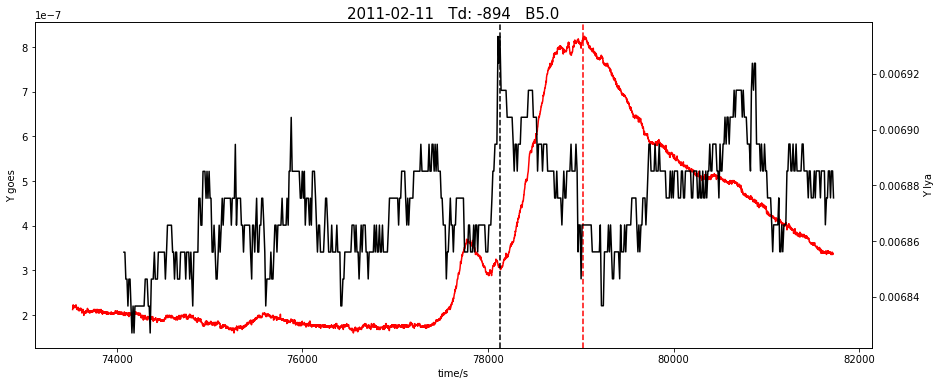

10


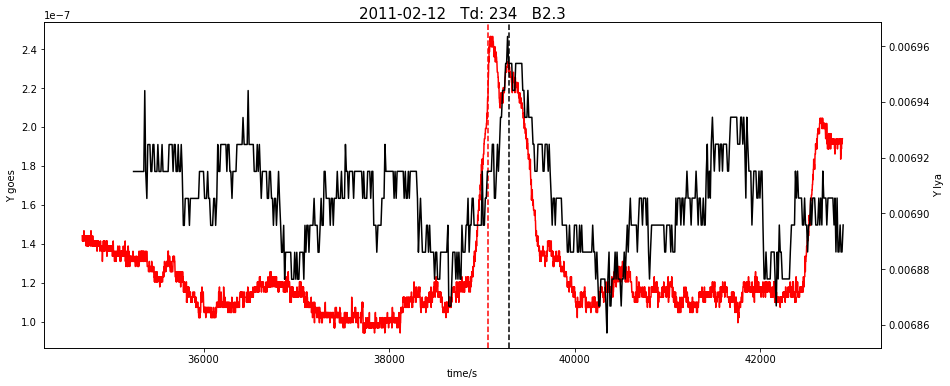

11


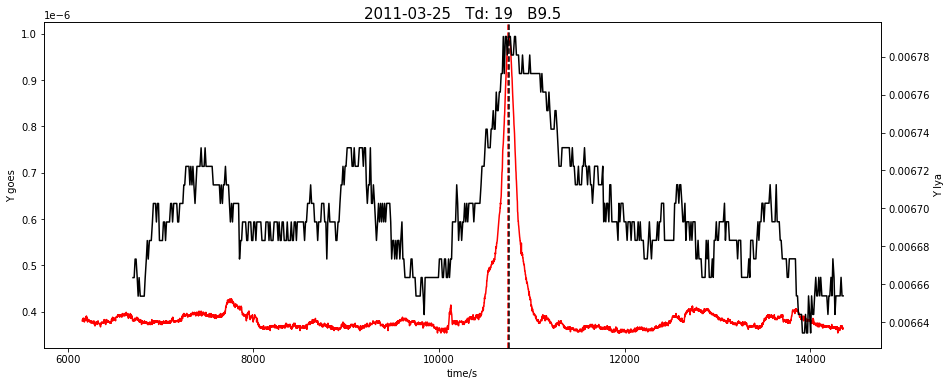

12


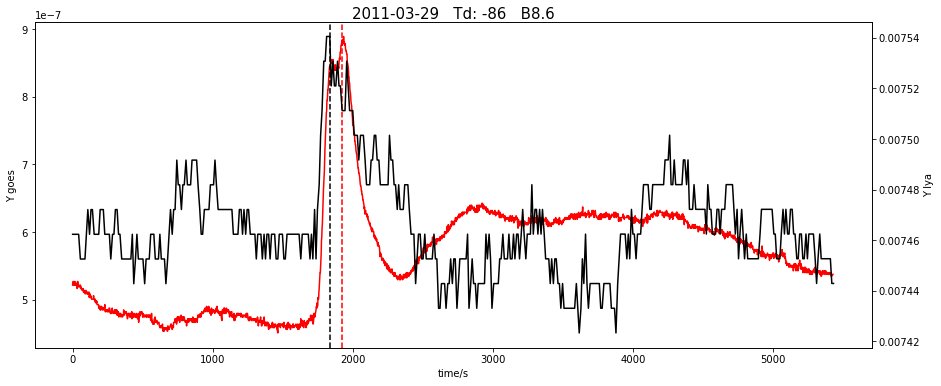

13


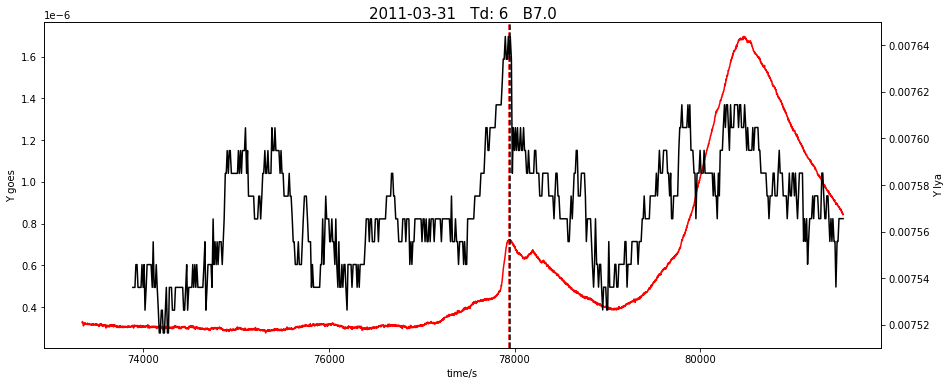

14


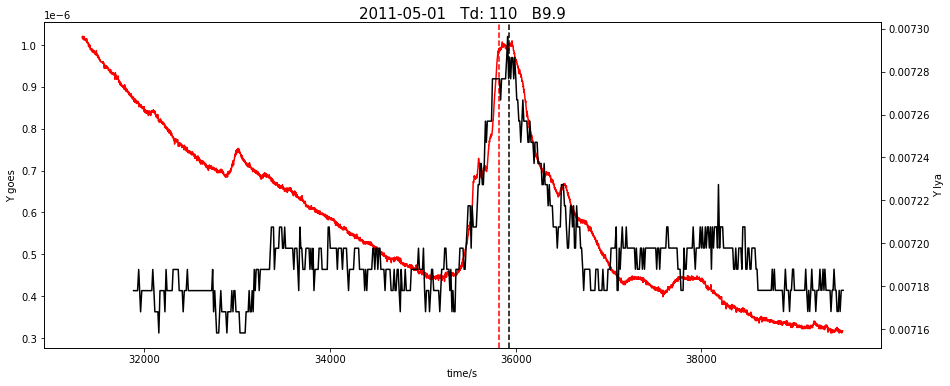

15


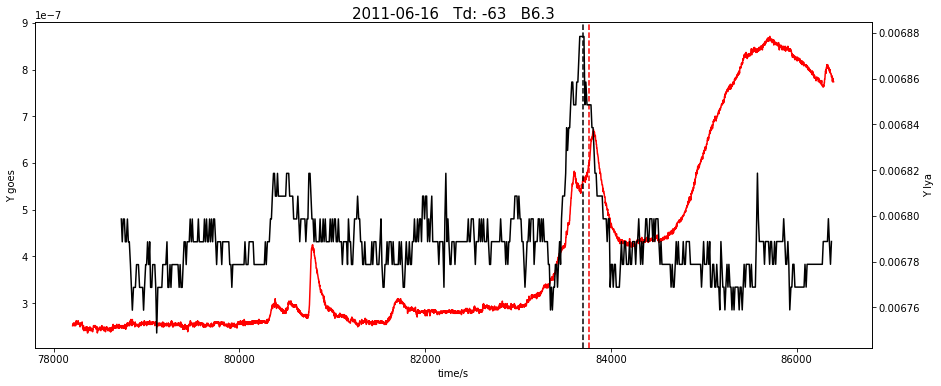

16


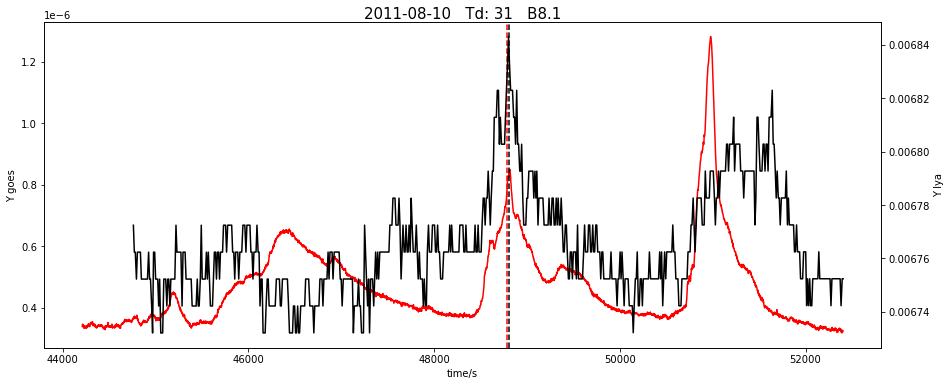

17


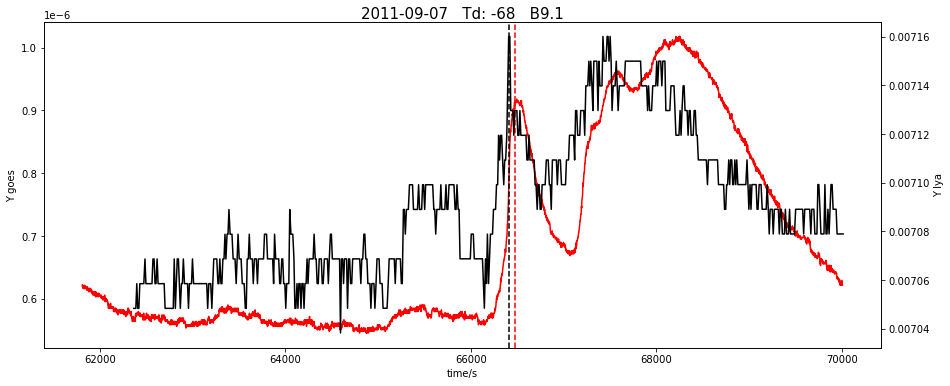

18


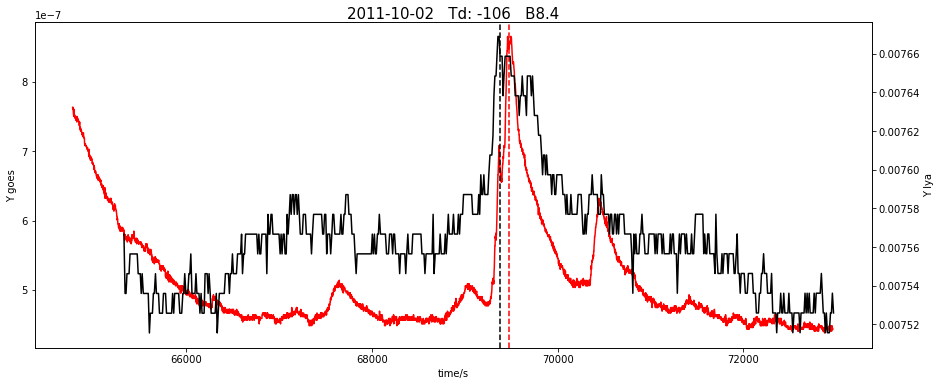

19


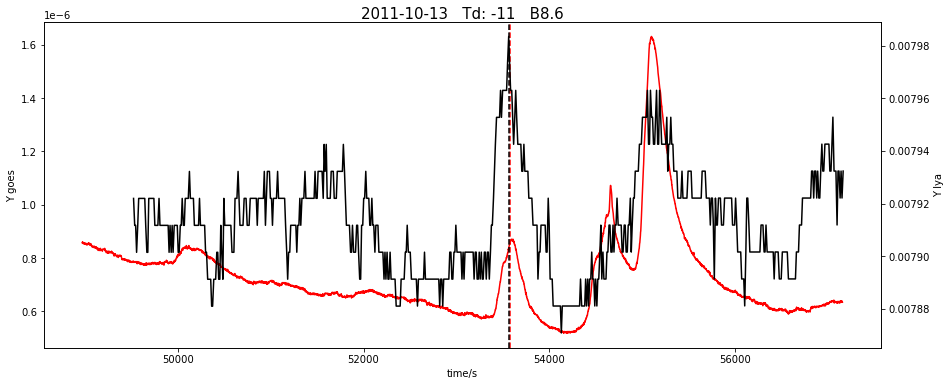

20


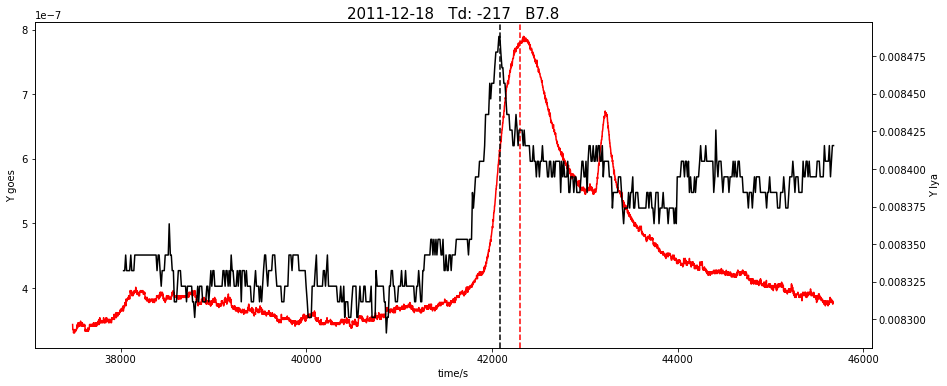

21


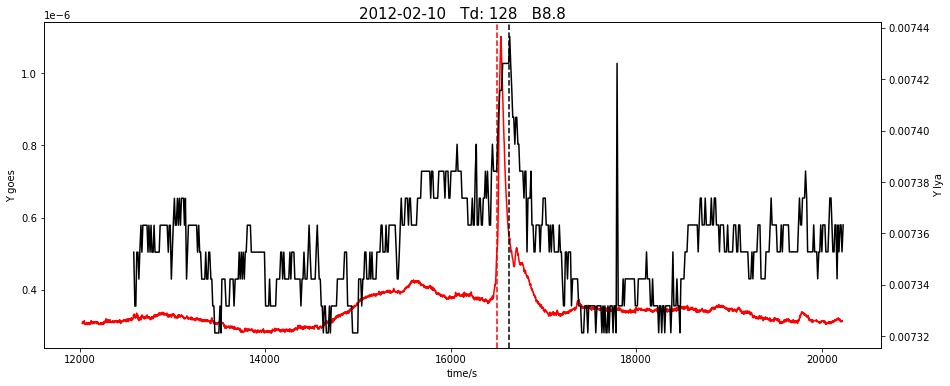

22


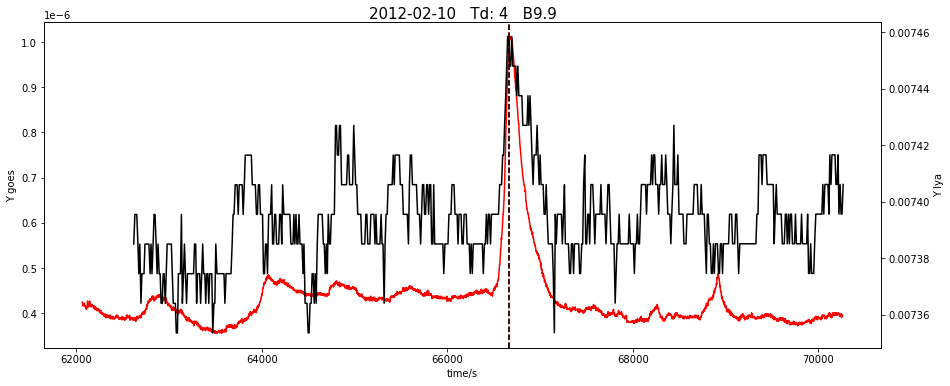

23


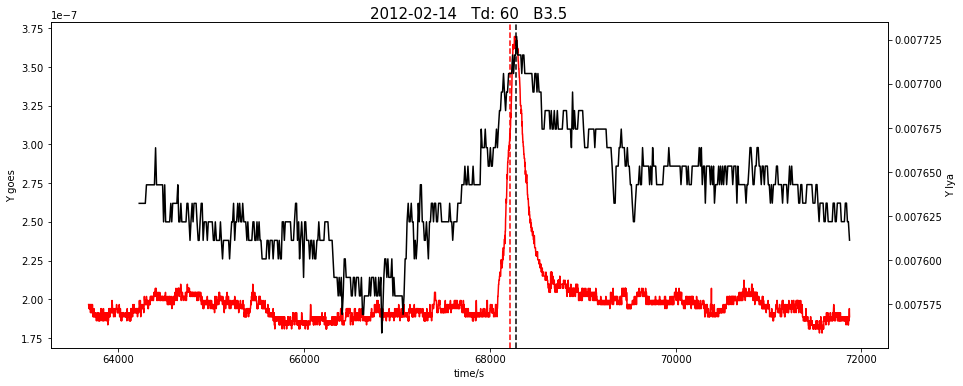

24


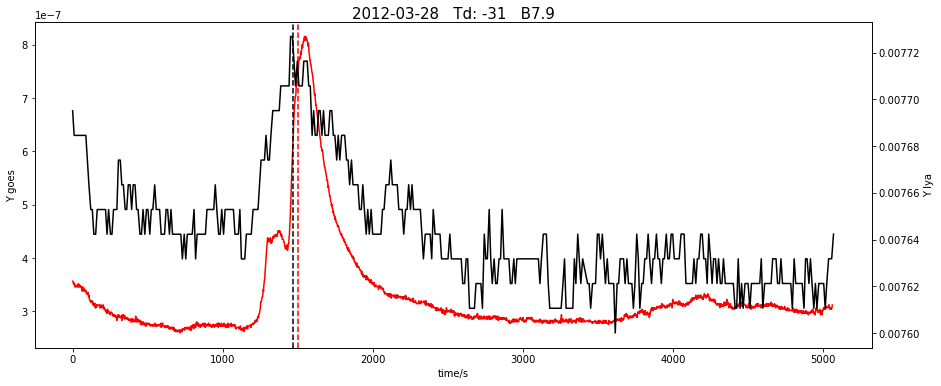

25


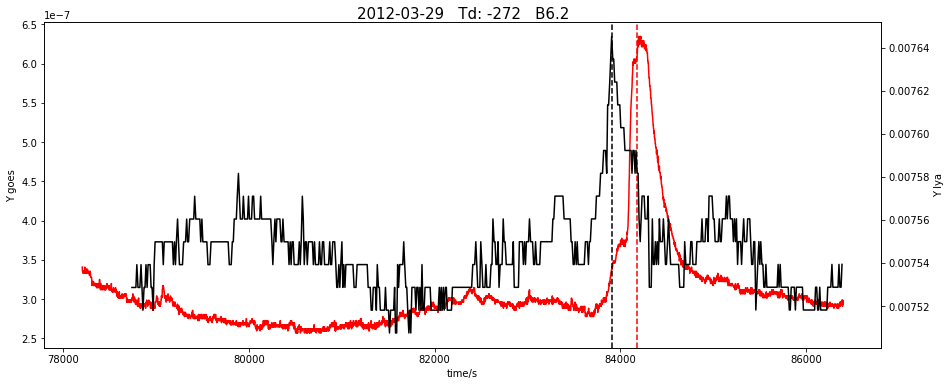

26


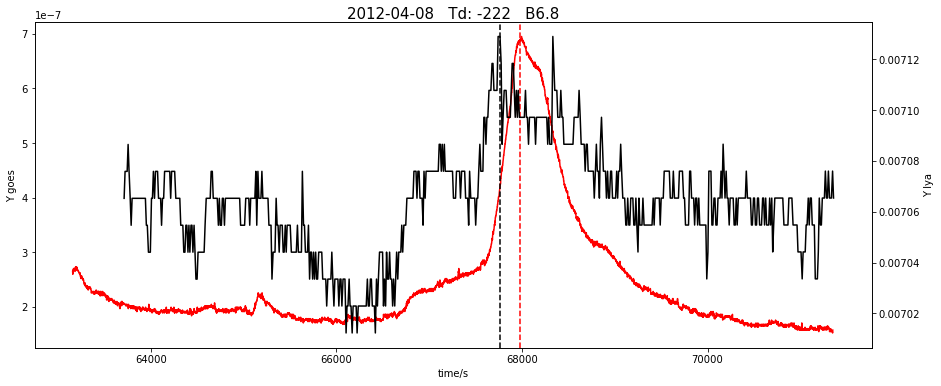

27


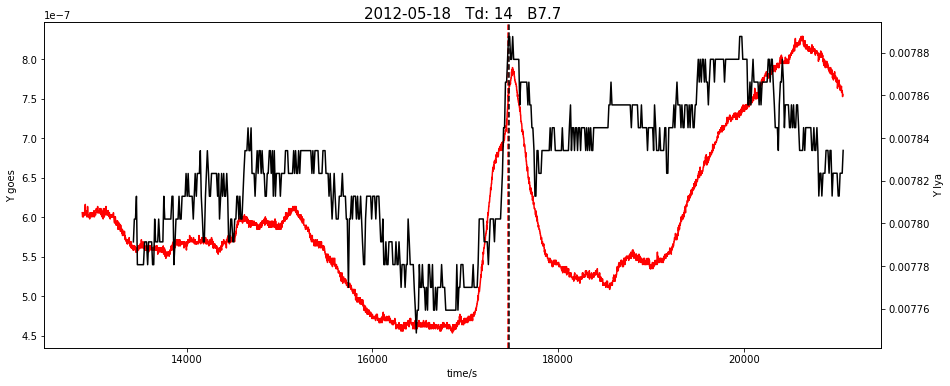

28


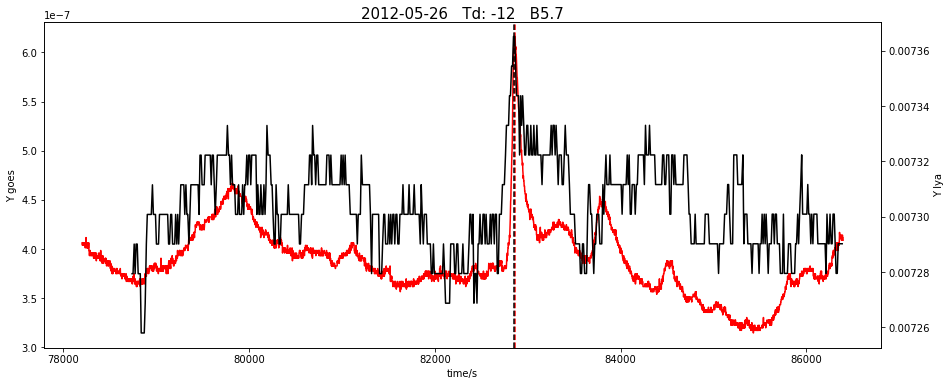

29


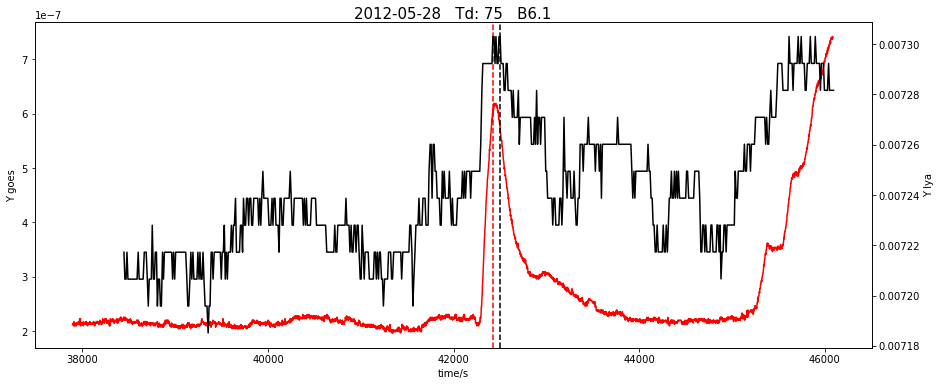

30


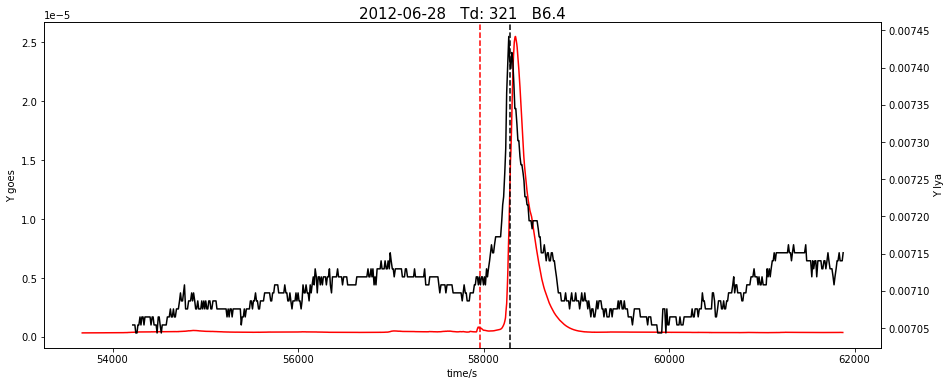

31


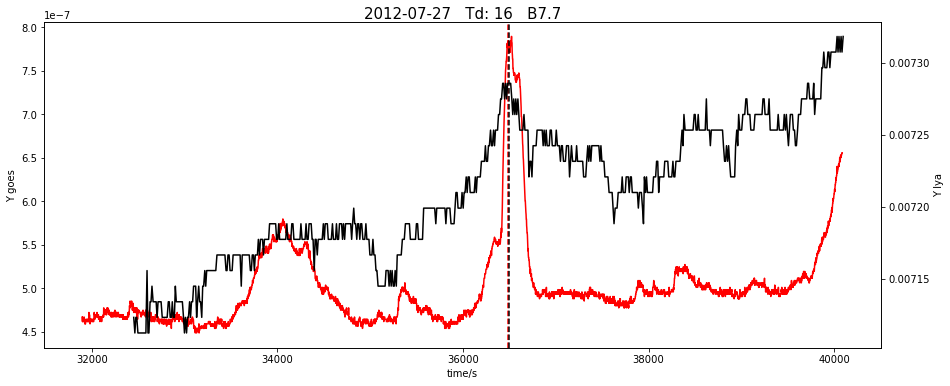

32


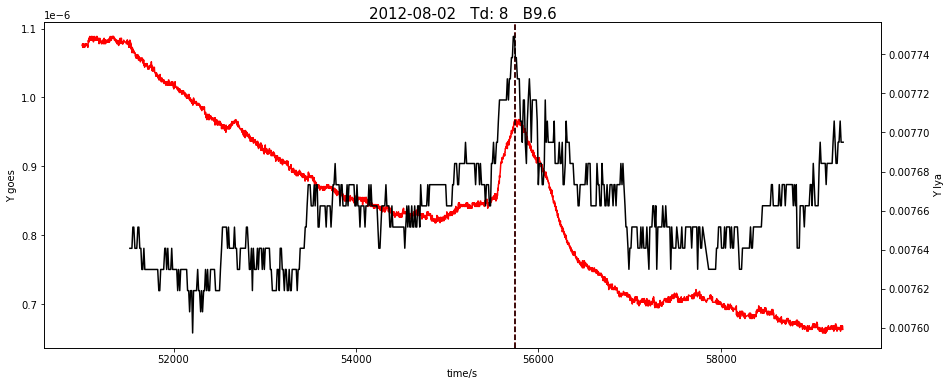

33


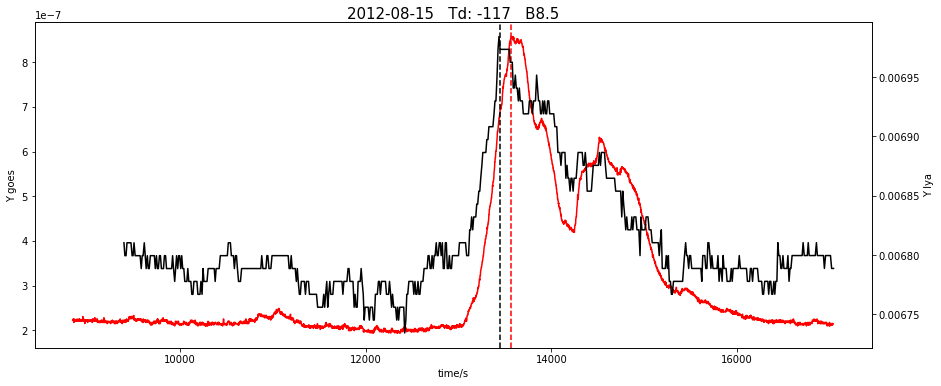

34


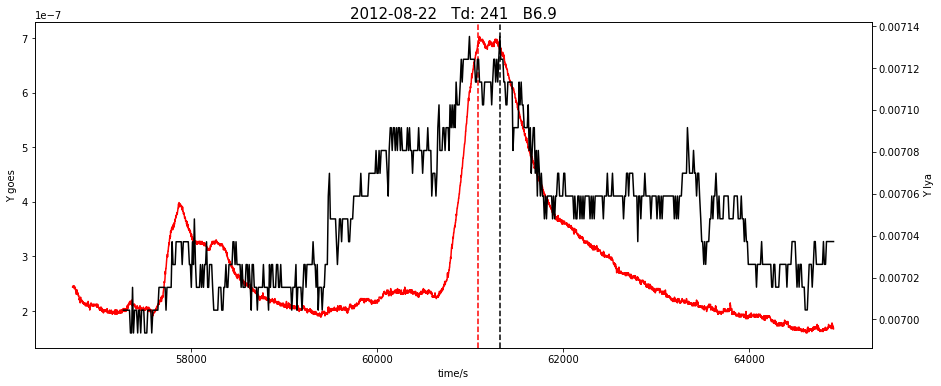

35


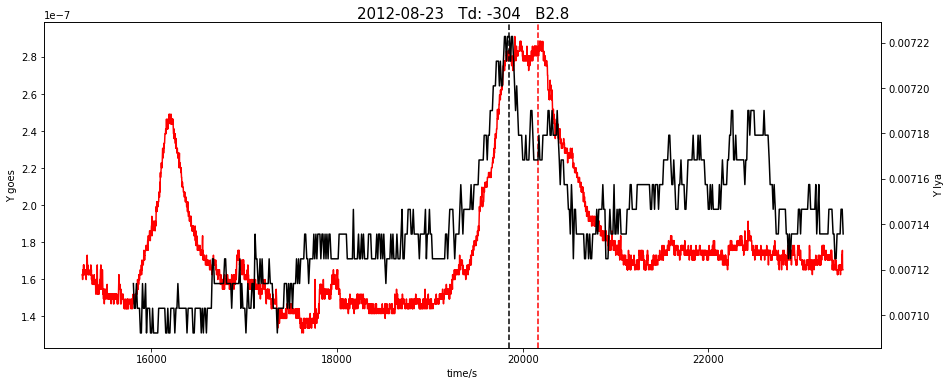

36


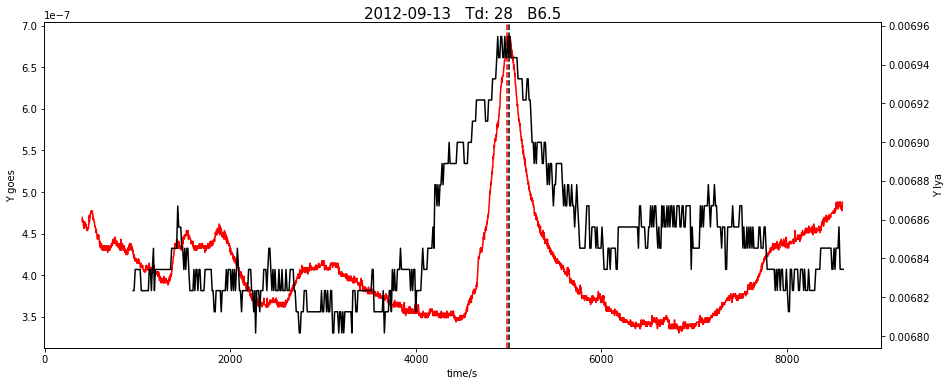

37


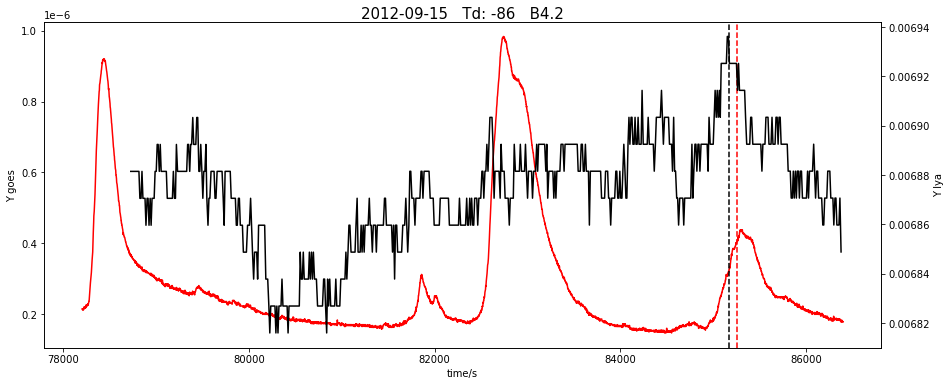

38


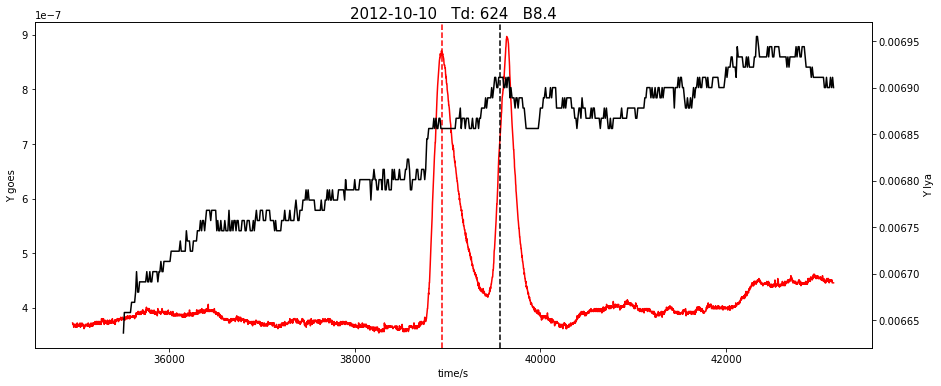

39


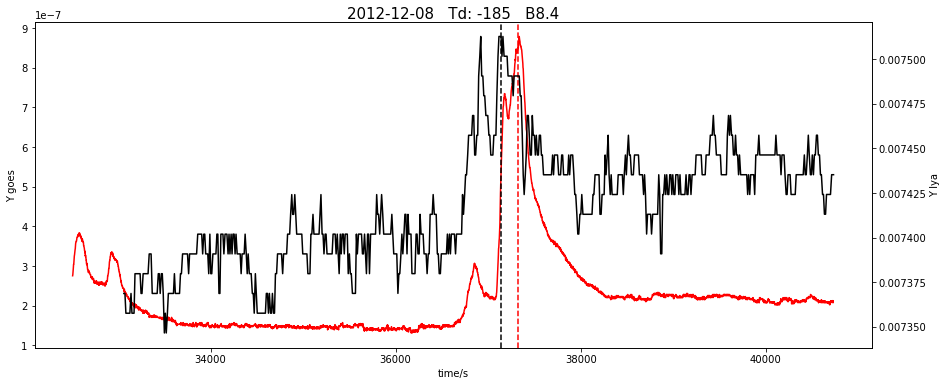

40


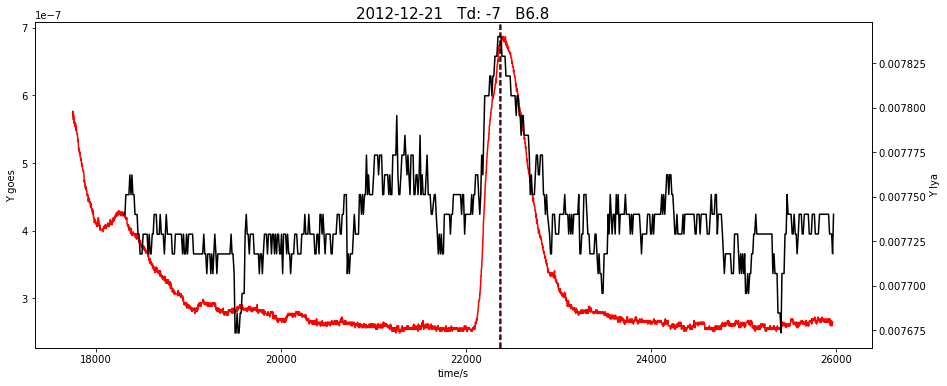

41


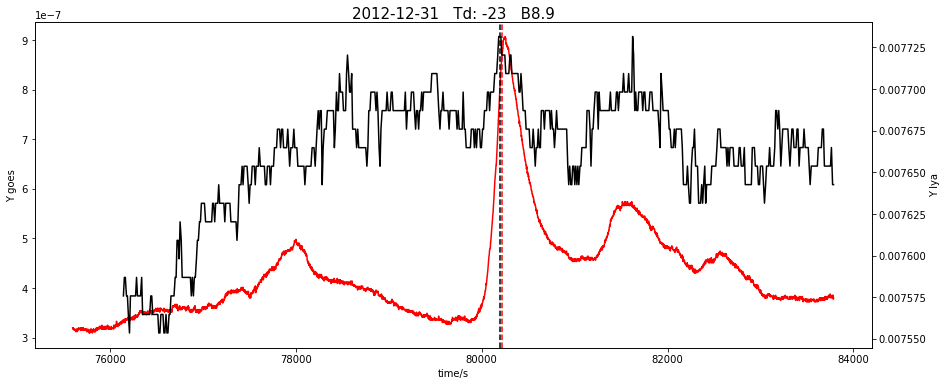

42


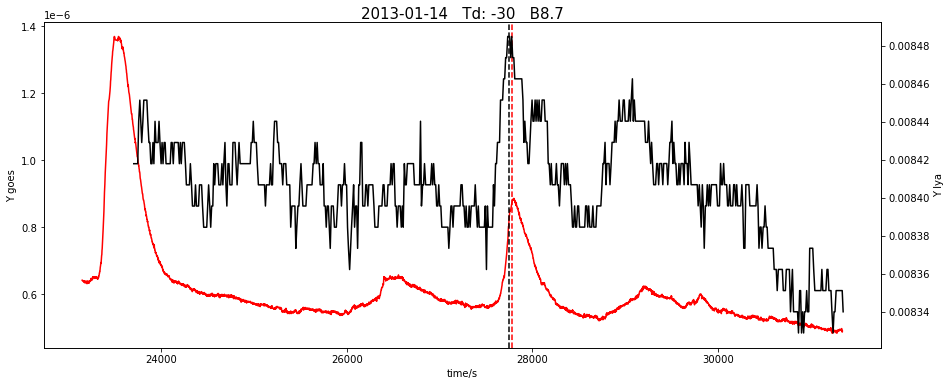

43


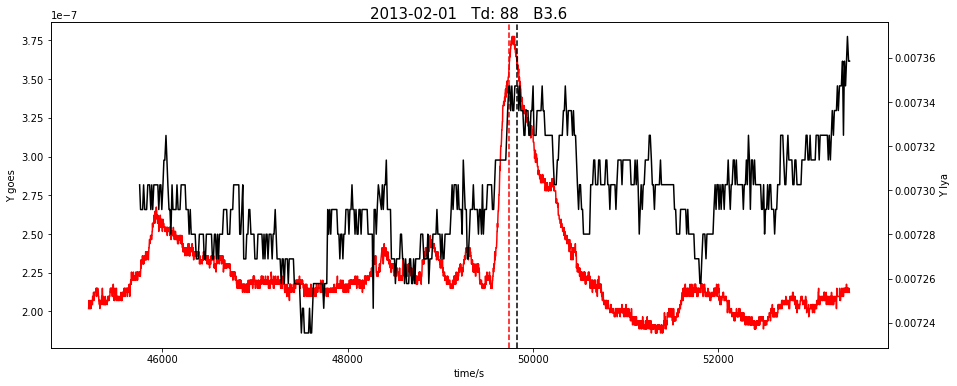

44


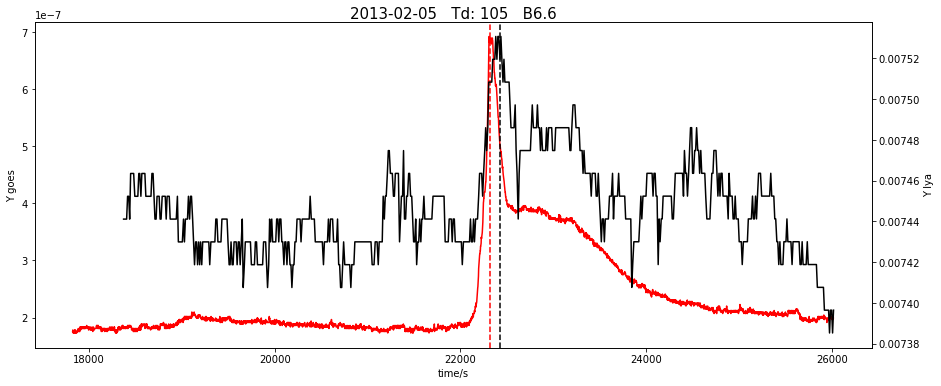

45


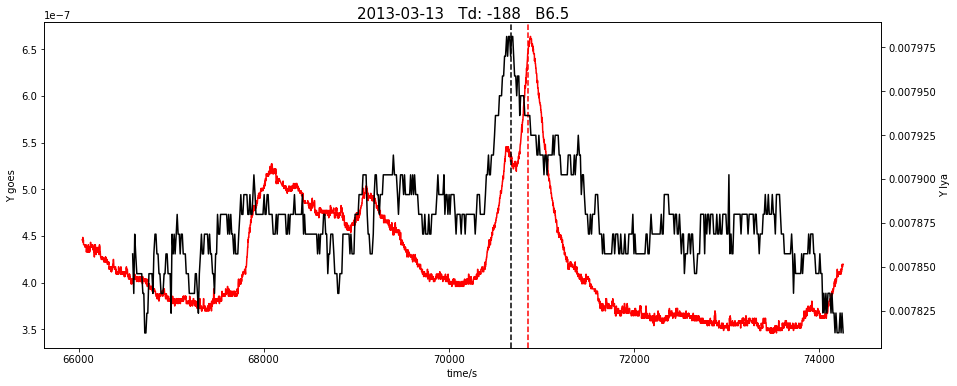

46


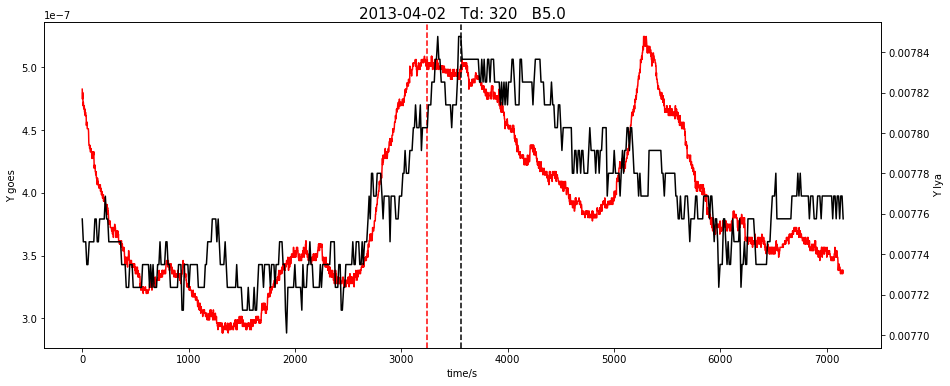

47


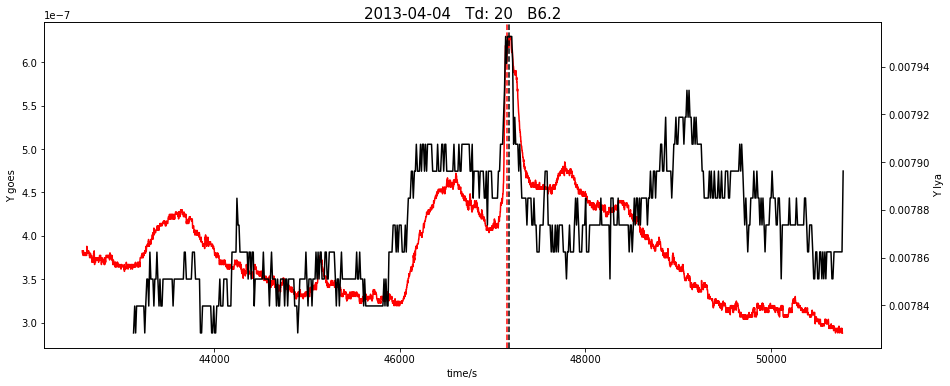

48


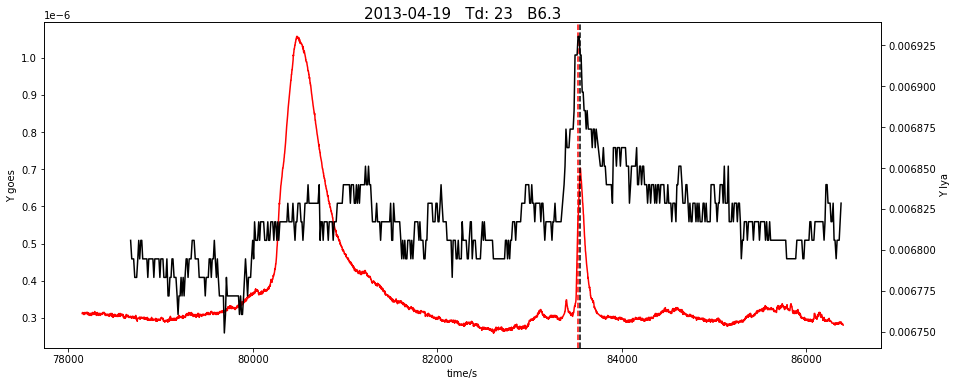

49


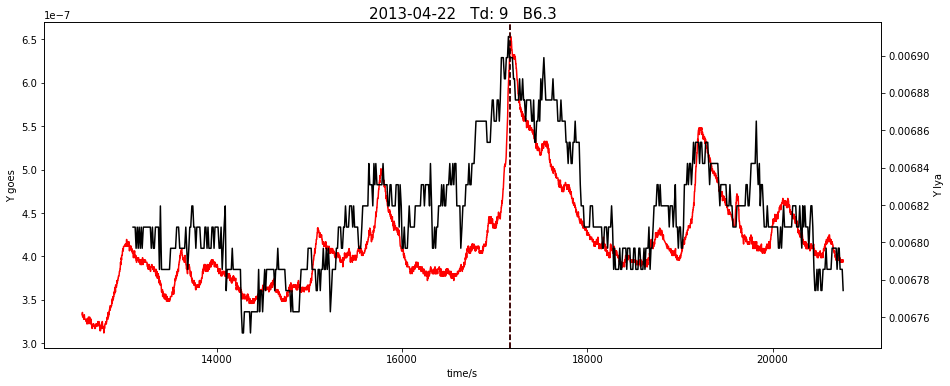

50


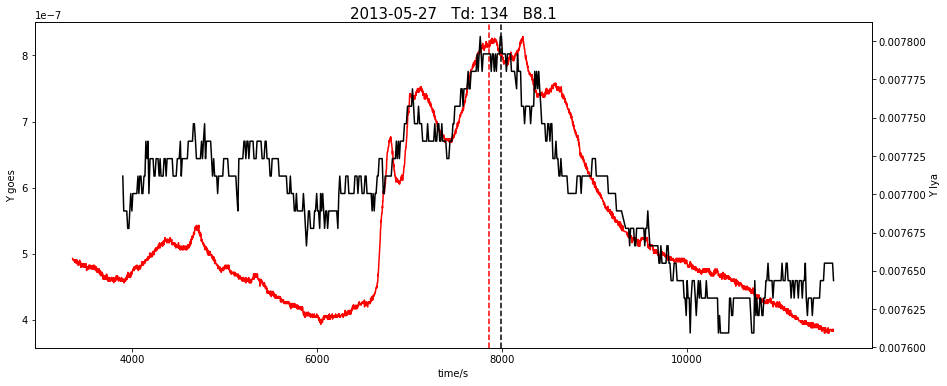

51


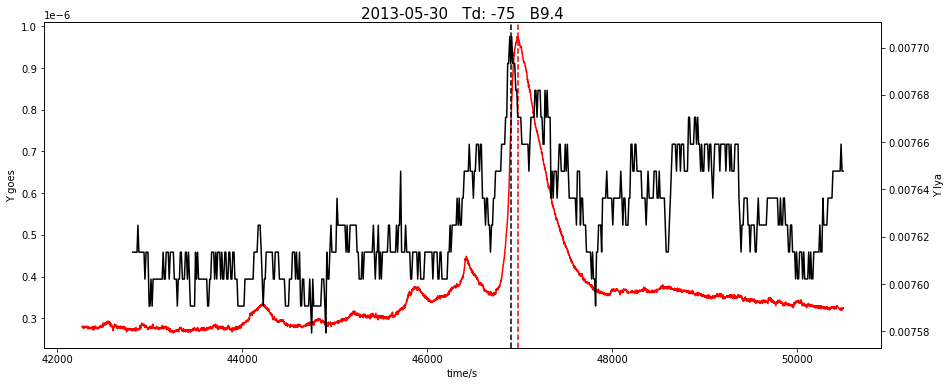

52


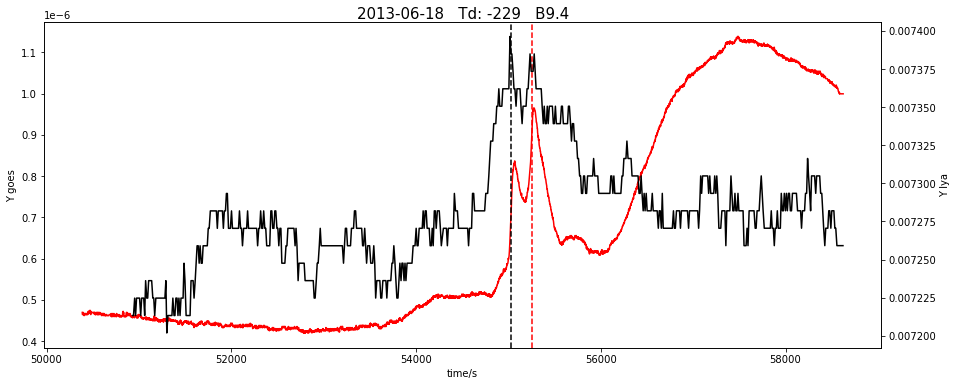

53


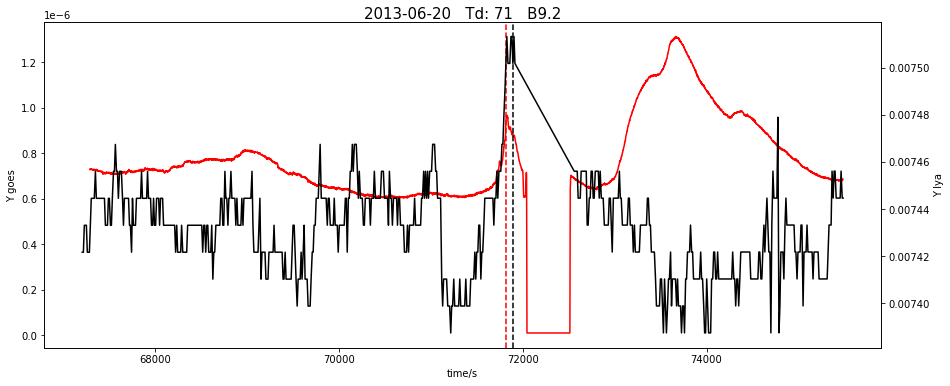

54


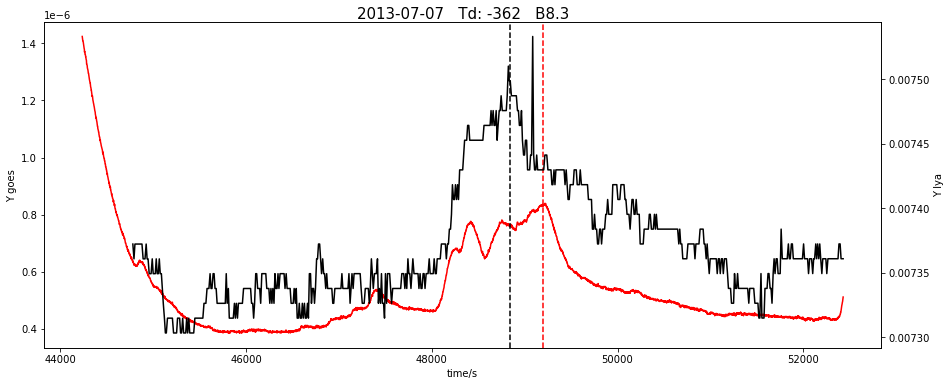

55


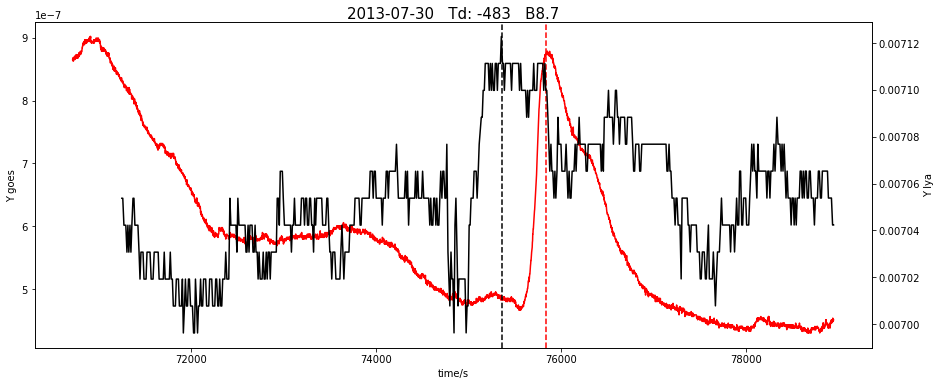

56


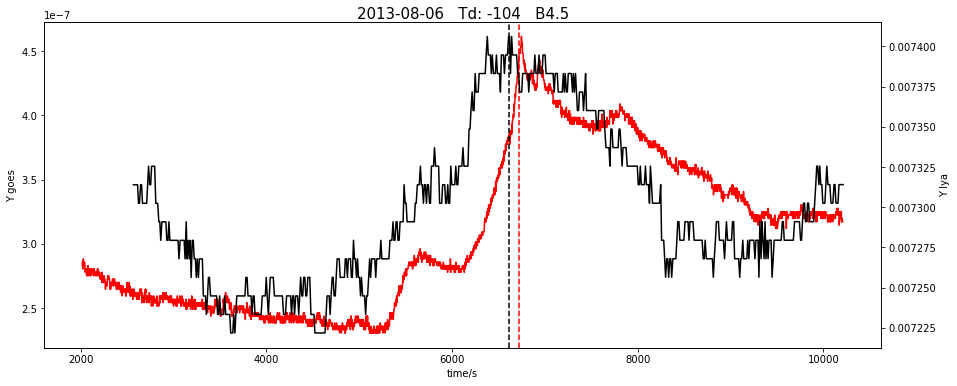

57


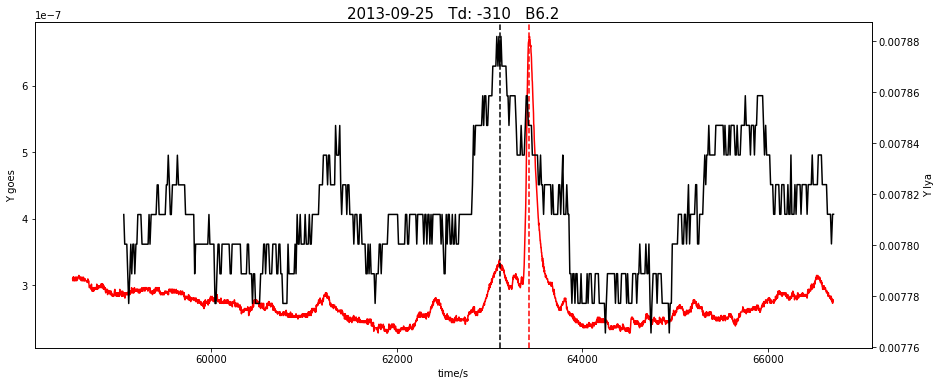

58


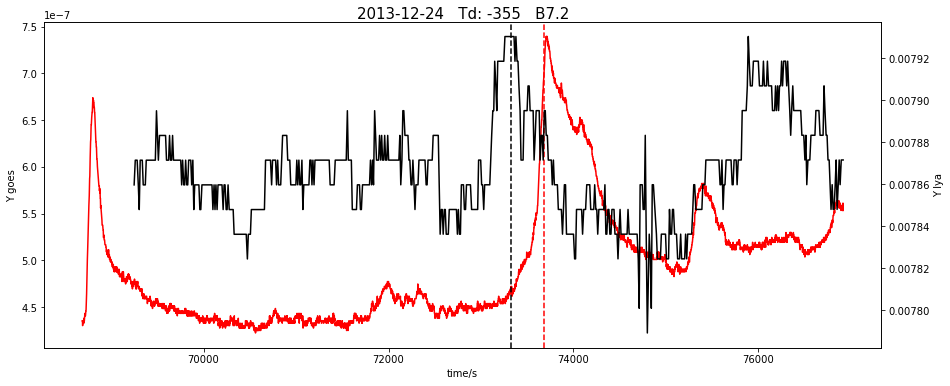

59


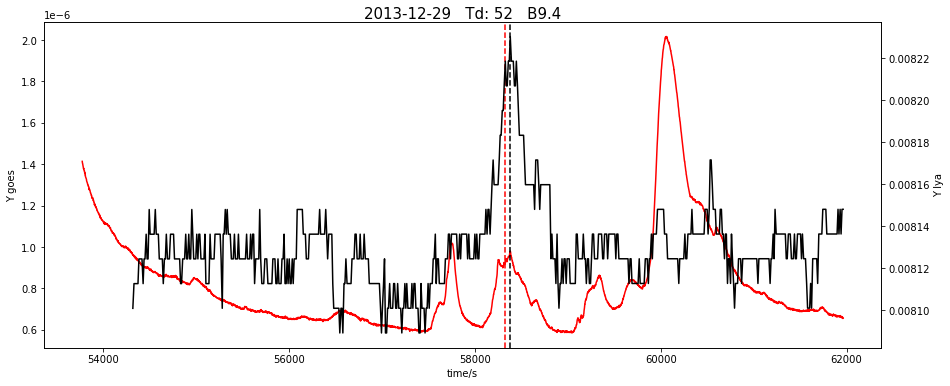

60


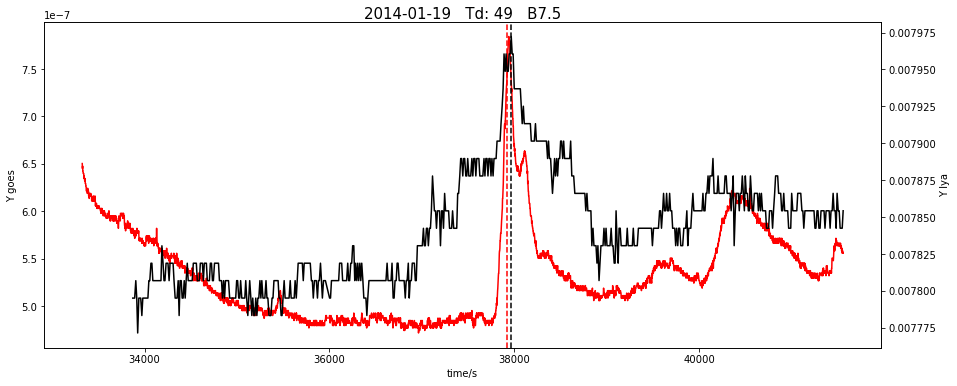

61


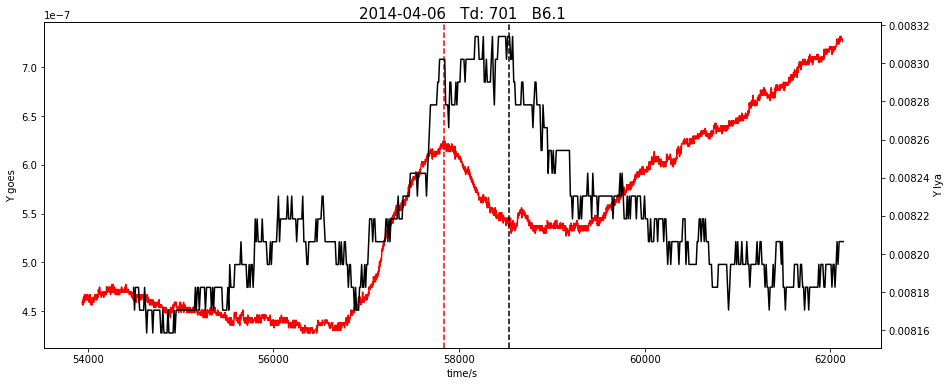

62


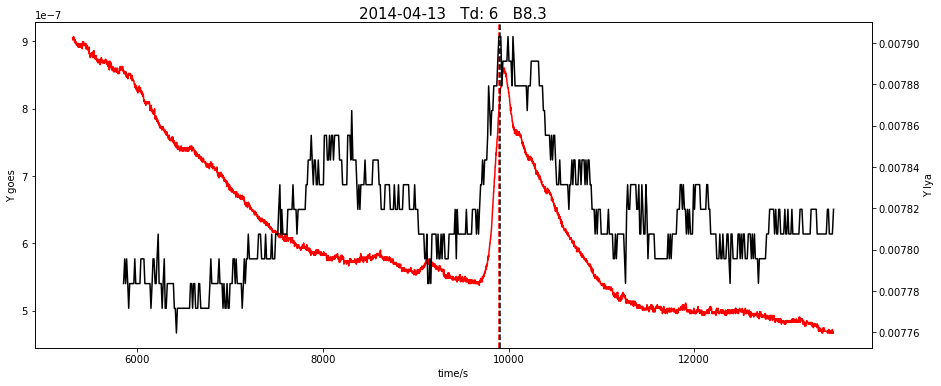

63


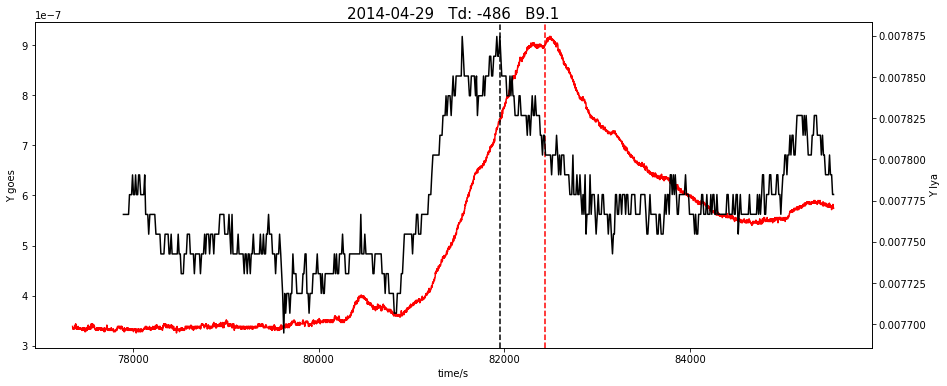

64


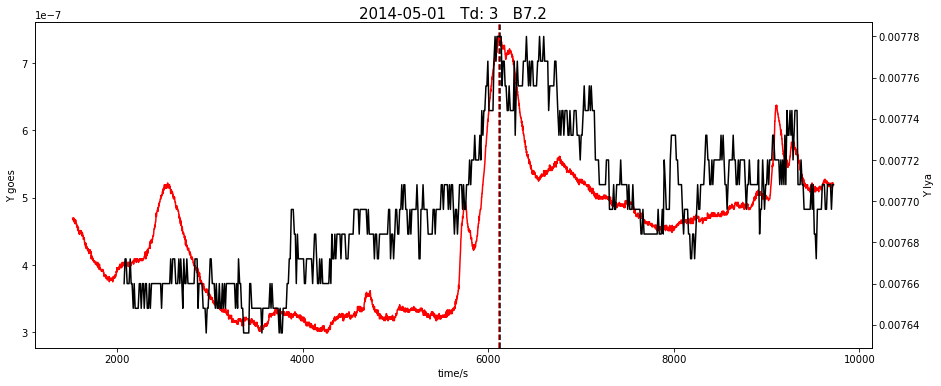

65


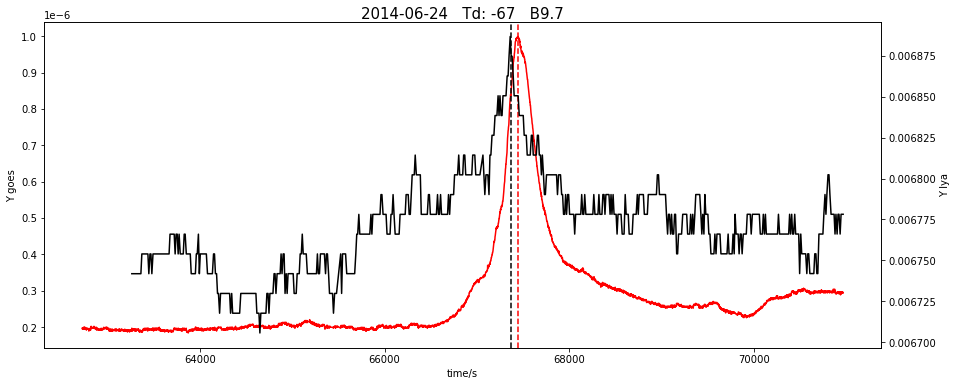

66


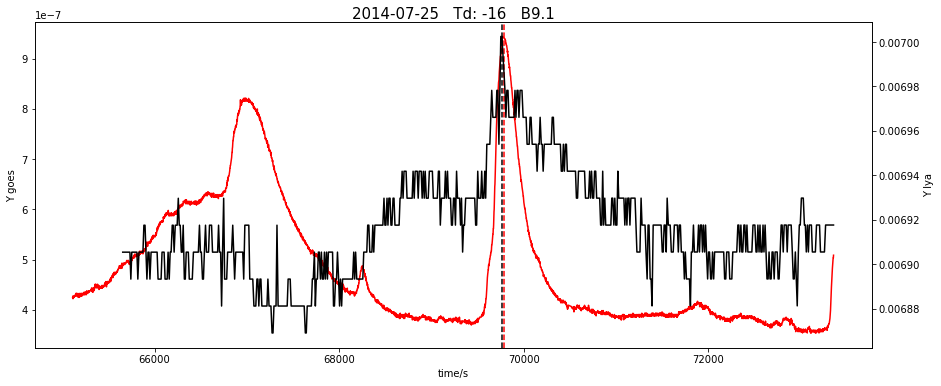

67


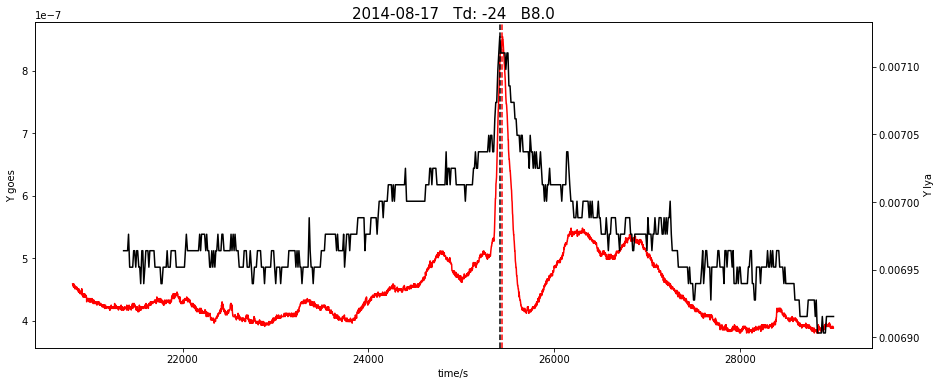

68


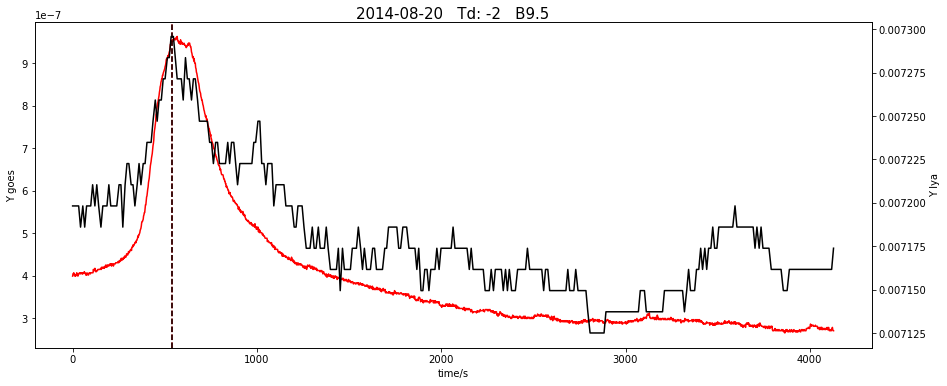

69


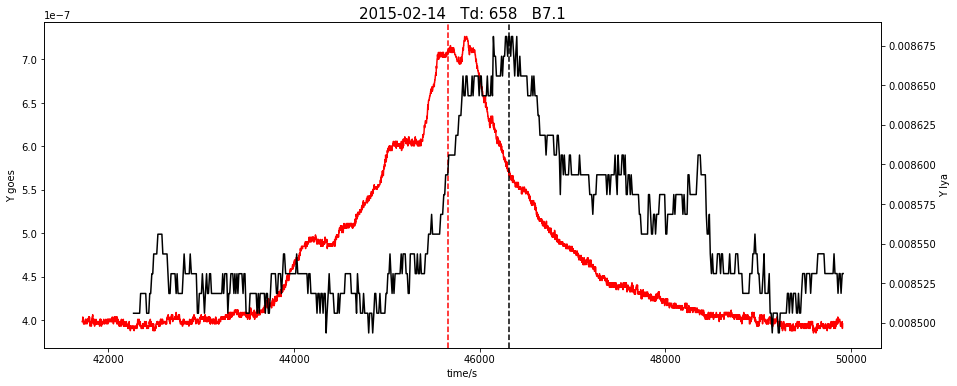

70


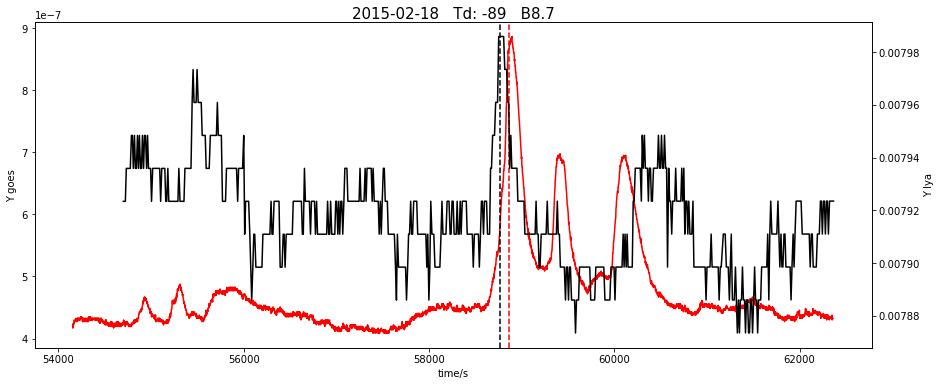

71


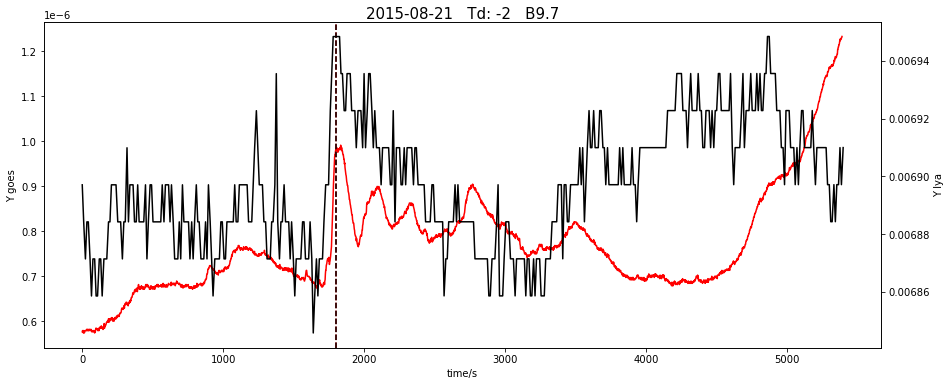

72


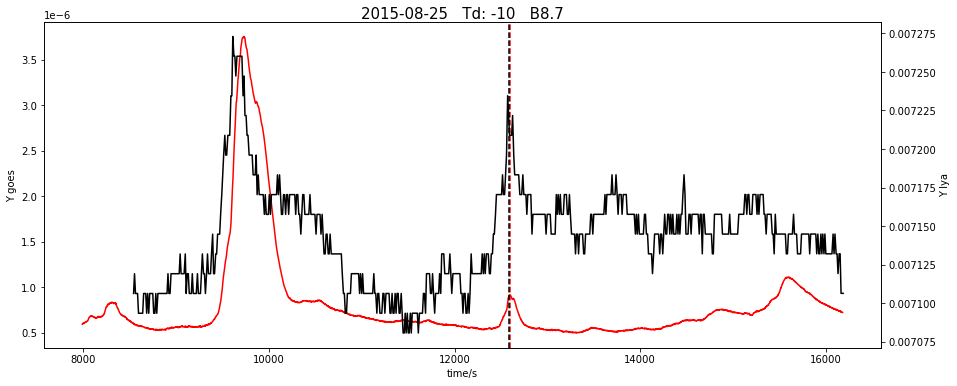

73


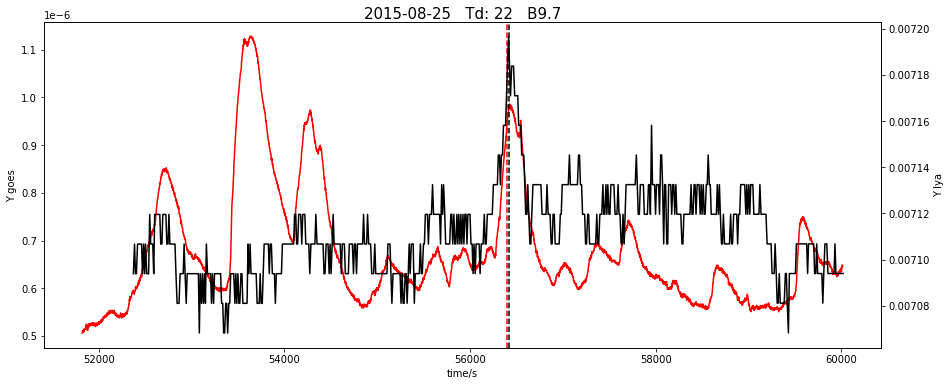

74


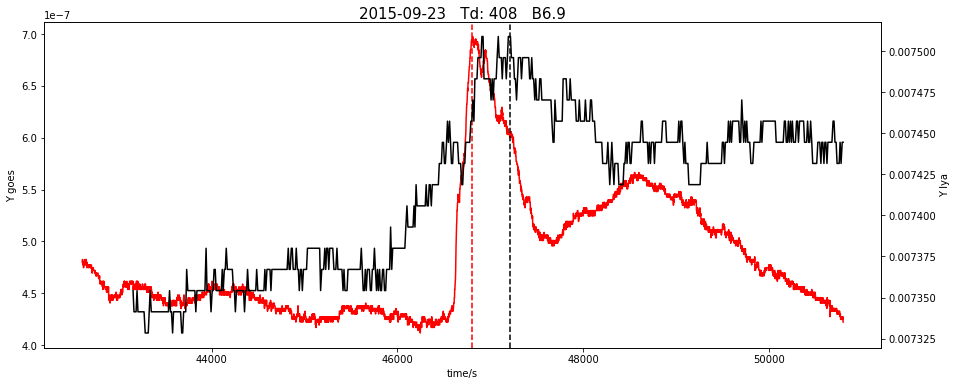

75


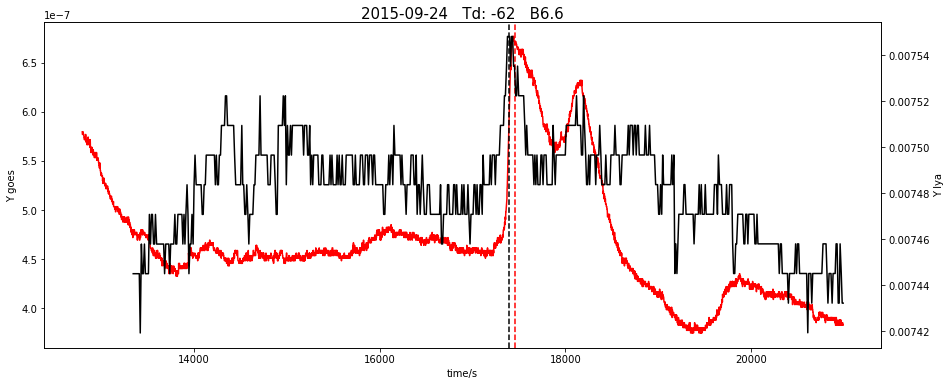

76


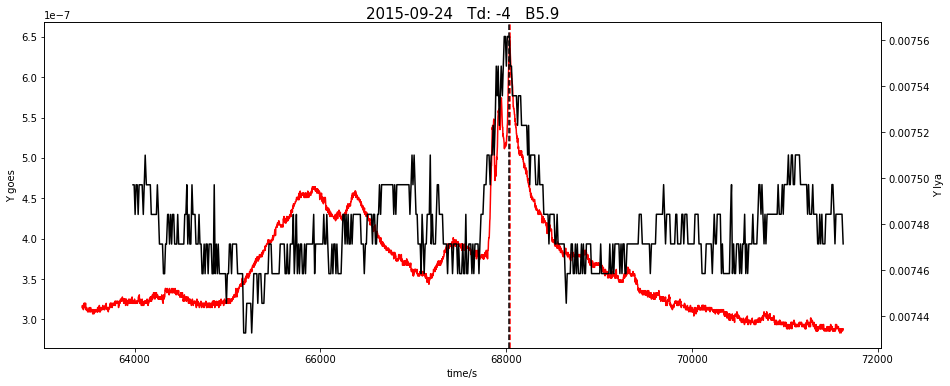

77


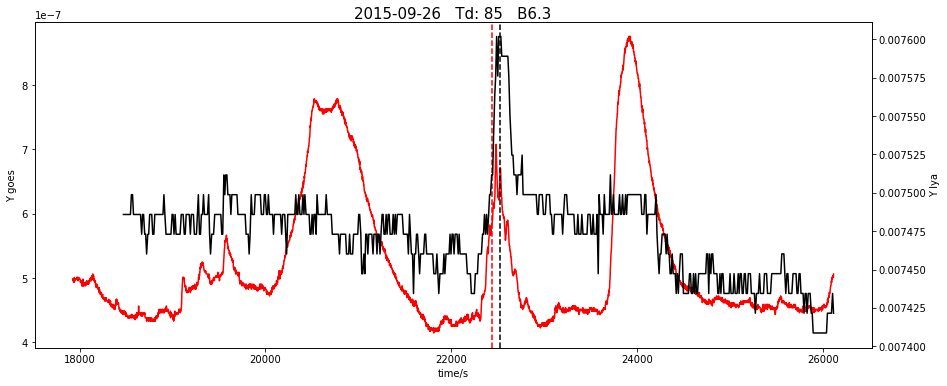

78


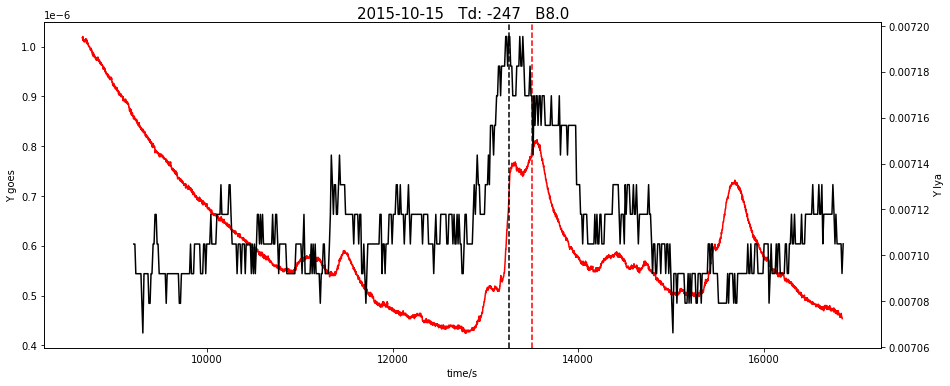

79


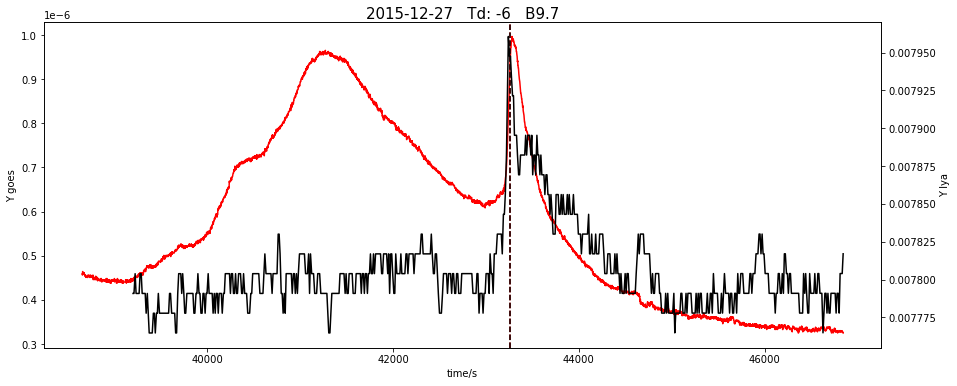

80


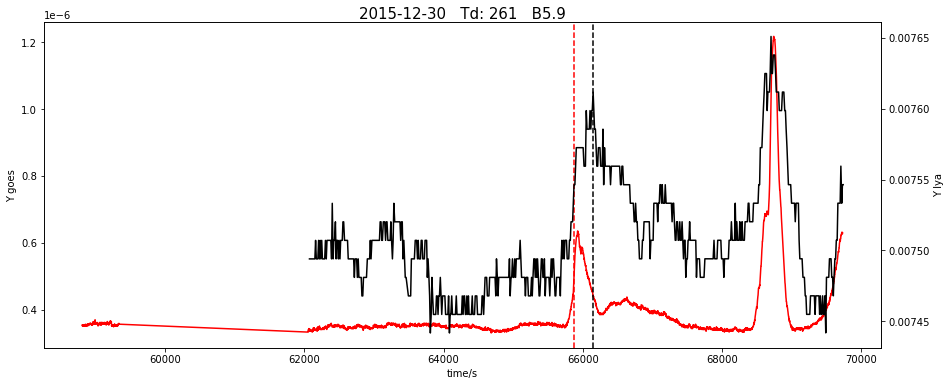

81


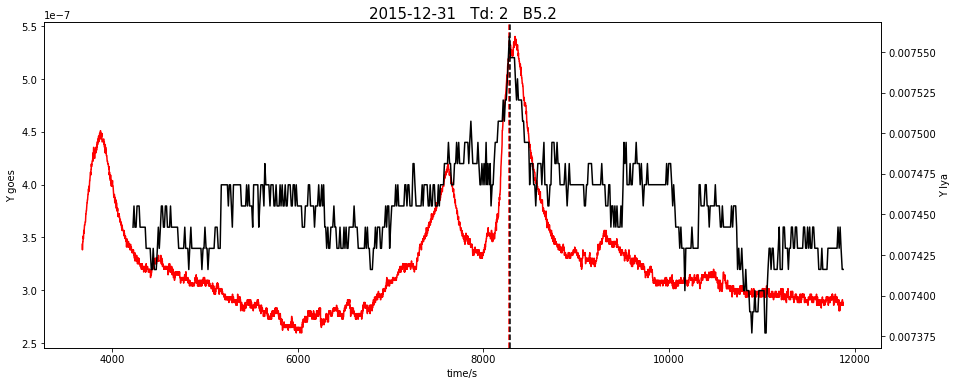

82


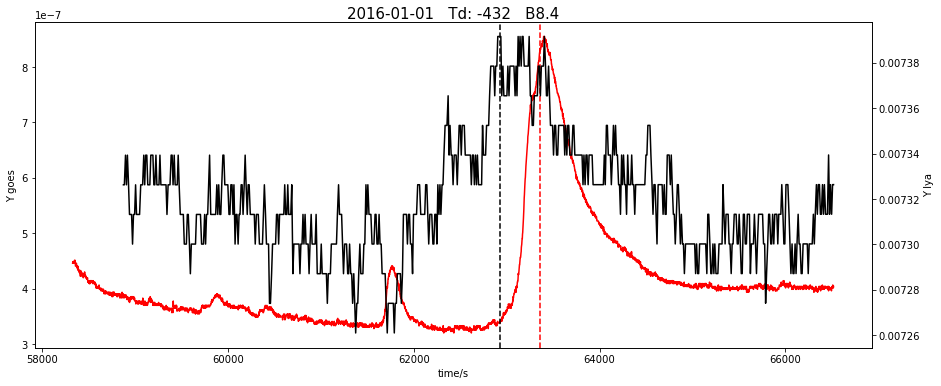

83


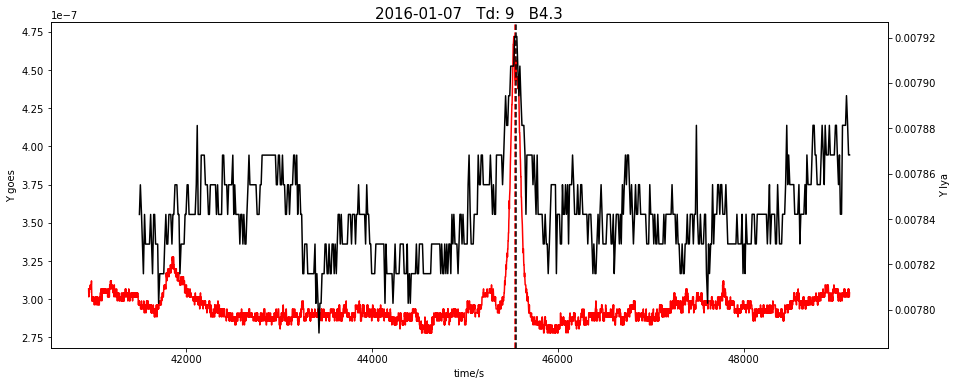

84


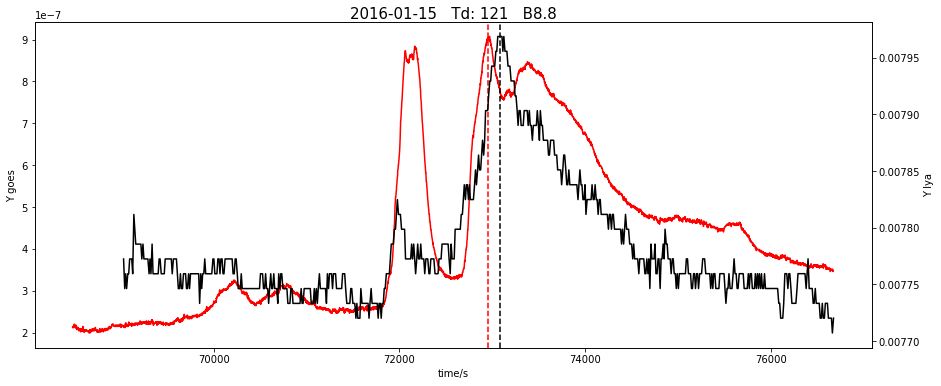

85


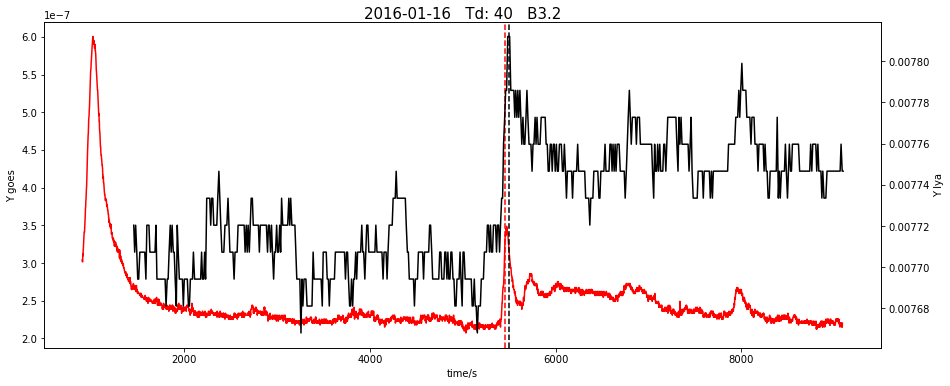

86


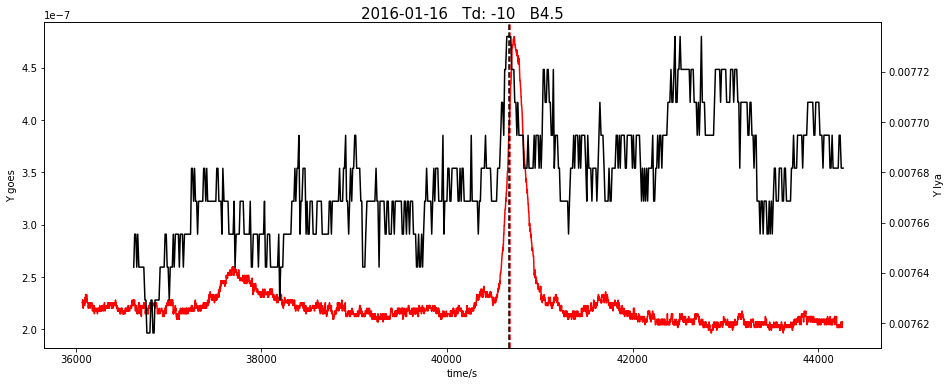

87


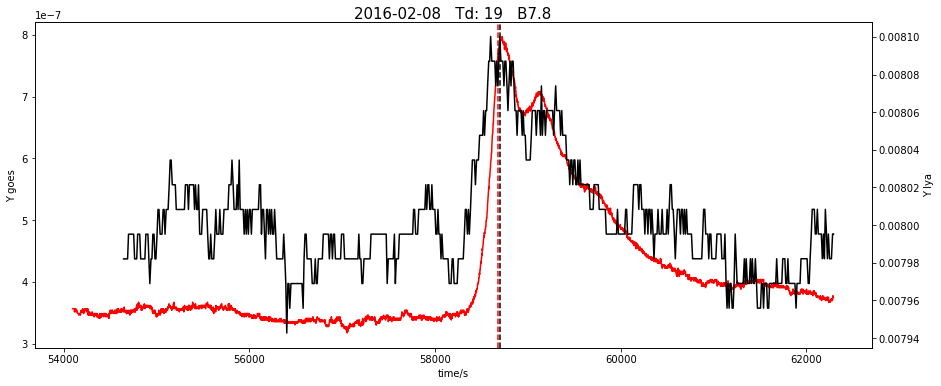

88


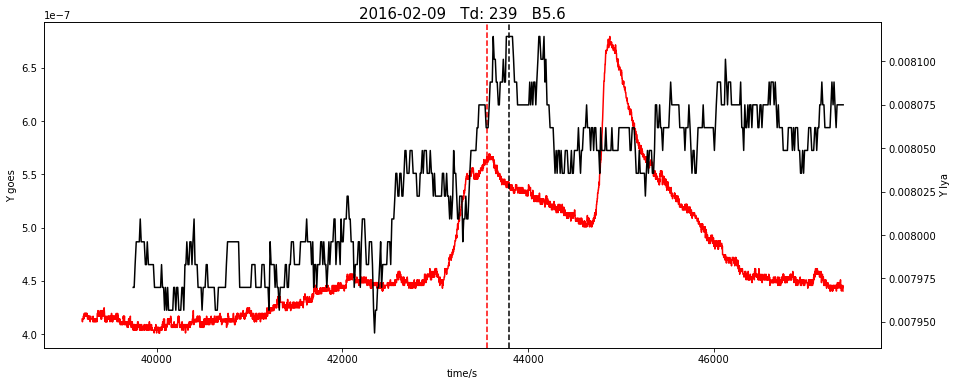

89


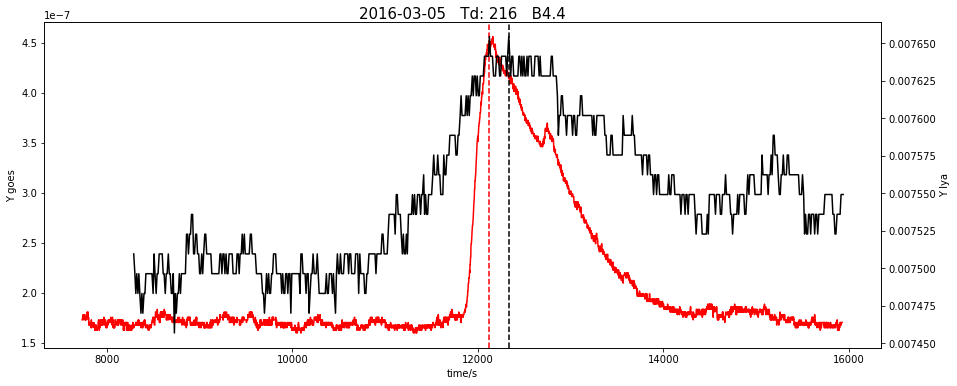

90


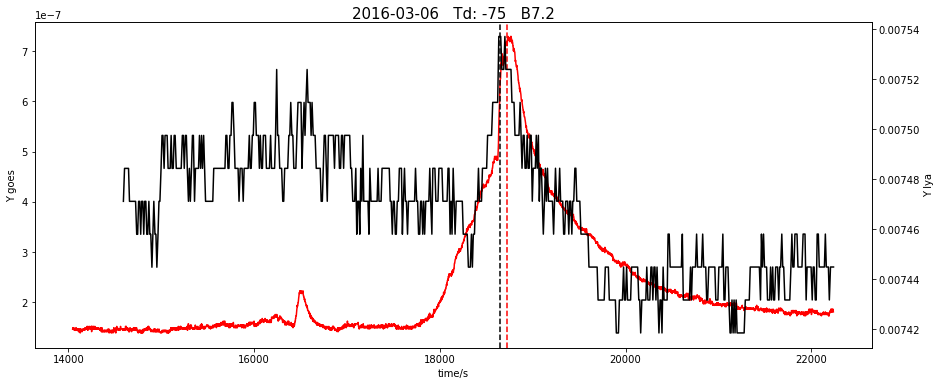

91


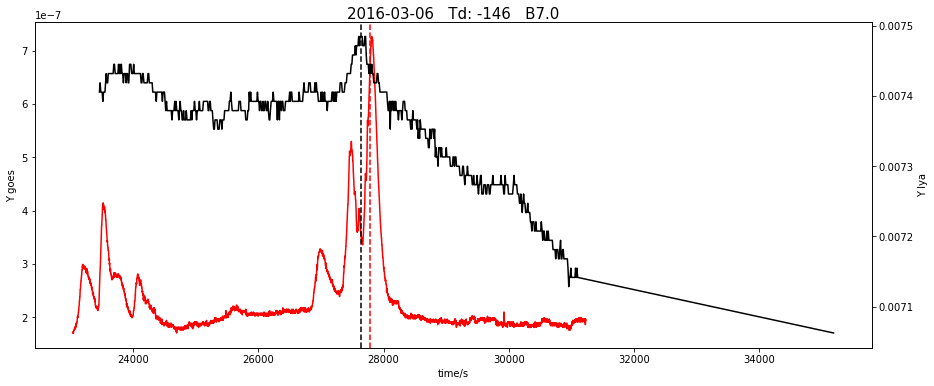

92


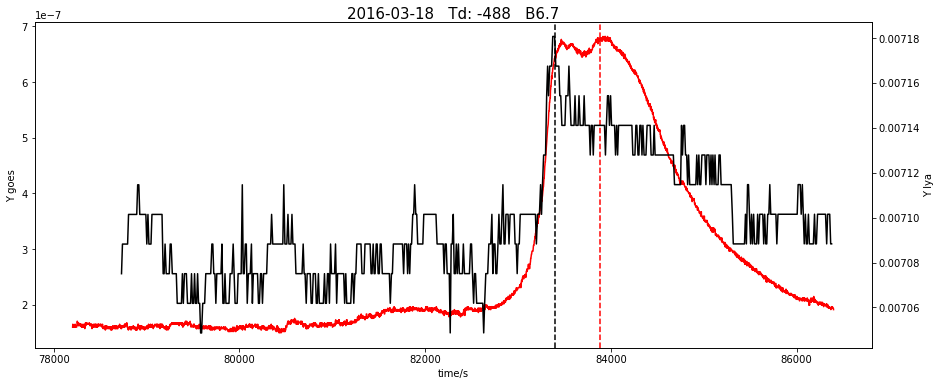

93


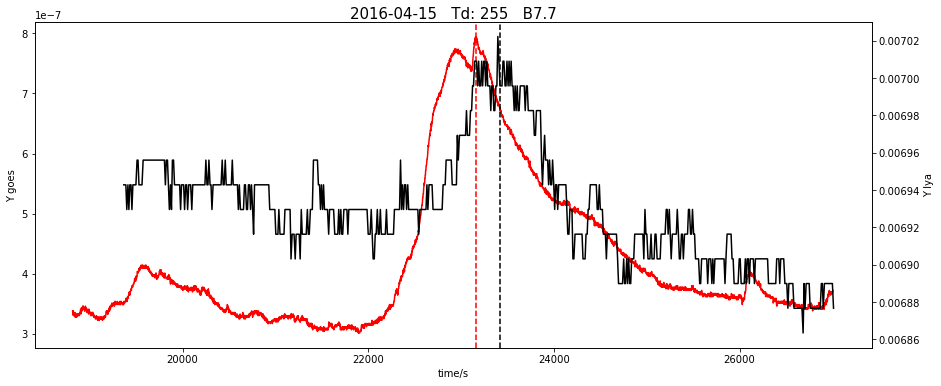

94


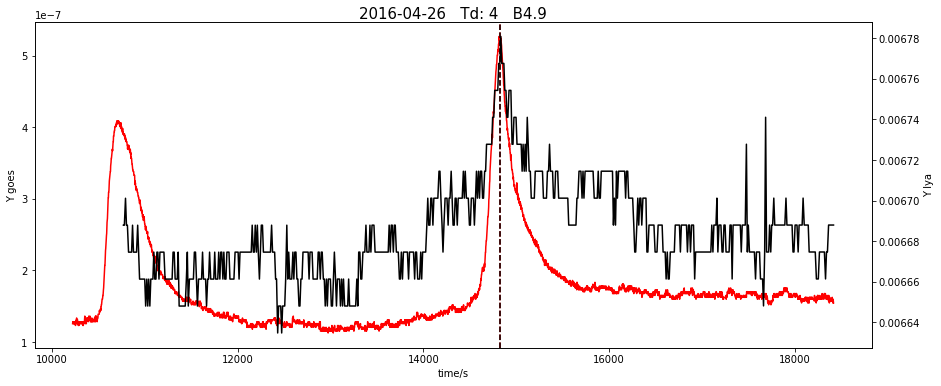

95


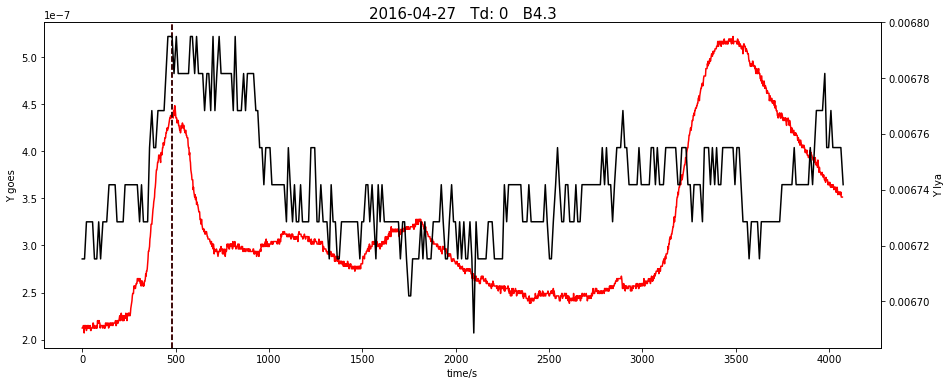

96


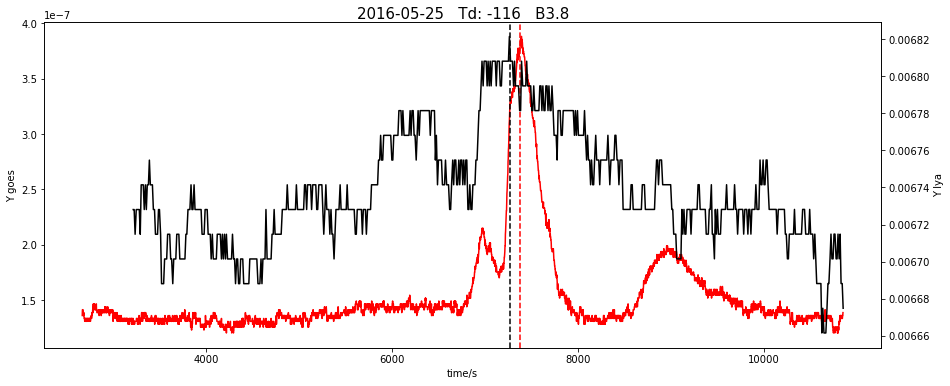

97


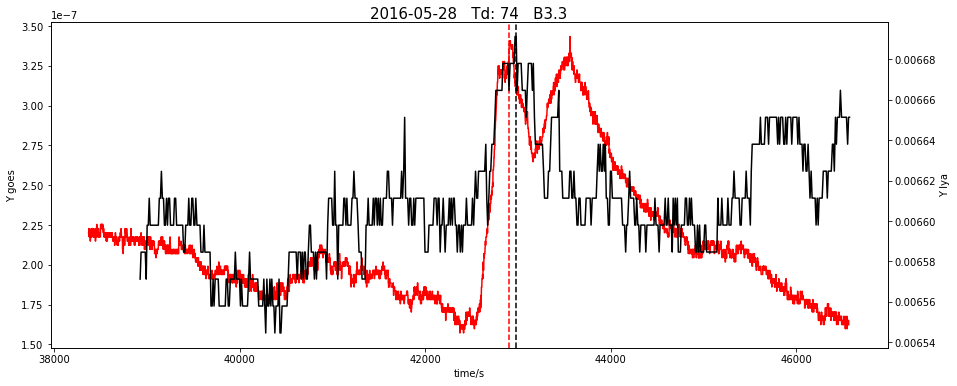

98


In [27]:
#绘图
import datetime
import time
import xlrd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as spio   #用来读取sav格式
import numpy as np 
import csv 
#from scipy import interpolate
import scipy
sheet_xrs_time = pd.read_csv('xrs_2010-2016_time.csv')
sheet_lya_time = pd.read_csv('lya_2010-2016_time.csv')
l_index=range(100)


list_time_lya_peak=[]
list_time_xrs_peak=[]
picture_name=[]#因中间少了0819数据，所以专门弄一个列表存图片名称，不然会串
picture_title=[]
for i in range(len(sheet_lya_time['DATE'])):
    a=sheet_lya_time['DATE'][i].split('-')[0]+sheet_lya_time['DATE'][i].split('-')[1]+sheet_lya_time['DATE'][i].split('-')[2]
    if(a=='20150819'):#中断点，不记录
        print('20150819跳过数据')
        continue
    
    list_time_lya_peak.append(int(sheet_lya_time['PEAKT'][i][0:2])*3600+int(sheet_lya_time['PEAKT'][i][3:5])*60+int(sheet_lya_time['PEAKT'][i][6:8]))
    list_time_xrs_peak.append(int(sheet_xrs_time['PEAKT'][i][0:2])*3600+int(sheet_xrs_time['PEAKT'][i][3:5])*60+int(sheet_xrs_time['PEAKT'][i][6:8]))
    picture_name.append(sheet_lya_time['DATE'][i]+'  '+sheet_lya_time['CLASS'][i])
    picture_title.append(sheet_lya_time['DATE'][i]+'   Td: '+str(sheet_lya_time['T_D'][i])+'   '+sheet_lya_time['CLASS'][i])


#原始数据绘制
for i in range(0,99):
    fig = plt.figure(figsize=(15,6))
    ax1 = fig.add_subplot(111)
    if(x_num_list[i]-4000>=0) and(lya_num_list[i]-700>=0): 
        c=x_num_list[i]-4000 #大致往前推两个小时，作为坐标轴开始
        d=lya_num_list[i]-700
        time1=sheet3_x_time[c:][i] #约2s的分辨率
        time2=sheet3_lya_time[d:][i] #约10s的分辨率
        ax2 = ax1.twinx()

        ax1.set_ylabel('Y goes');

        ax2.set_ylabel('Y lya');
        ax1.set_xlabel('time/s');
        
        ax1.plot(time1,sheet3_x_value[c:][i],color='r',label="xrs")
        plt.axvline(list_time_xrs_peak[i],color='red',linestyle='--')
        ax2.plot(time2,sheet3_lya_value[d:][i],color='k',label="Lya")
        plt.axvline(list_time_lya_peak[i],color='k',linestyle='--')
        plt.title(picture_title[i],va = 'center',size=15)
        #plt.savefig('/home/tzy/Desktop/python_text/curve_png_new/'+picture_name[i]+'.png', format='png', bbox_inches='tight',dpi=600)
        
        plt.show()
        print(i)
    else:
        time1=sheet3_x_time[:][i] #约2s的分辨率
        time2=sheet3_lya_time[:][i] #约10s的分辨率
        ax2 = ax1.twinx()

        ax1.set_ylabel('Y goes');
        ax2.set_ylabel('Y lya');
        ax1.set_xlabel('time/s');
        ax1.plot(time1,sheet3_x_value[:][i],color='r',label="xrs")
        plt.axvline(list_time_xrs_peak[i],color='red',linestyle='--')
        ax2.plot(time2,sheet3_lya_value[:][i],color='k',label="Lya")
        plt.axvline(list_time_lya_peak[i],color='k',linestyle='--')
        plt.title(picture_title[i],va = 'center',size=15)
        #plt.savefig('/home/tzy/Desktop/python_text/curve_png_new/'+picture_name[i]+'.png', format='png', bbox_inches='tight',dpi=600)
        plt.show()
        print(i)

In [5]:
list_time_xrs_peak

[17700,
 31580,
 19740,
 48240,
 63425,
 11760,
 59940,
 10920,
 35260,
 79790,
 79020,
 39105,
 10740,
 1920,
 77940,
 35855,
 83800,
 48815,
 66480,
 69480,
 53605,
 42345,
 16540,
 66674,
 68270,
 1550,
 84180,
 67980,
 17500,
 82860,
 42440,
 57960,
 36530,
 55740,
 13560,
 61080,
 19930,
 4980,
 85295,
 38940,
 37320,
 22380,
 80255,
 27780,
 49785,
 22320,
 70860,
 3240,
 47190,
 83550,
 17160,
 7905,
 46980,
 55260,
 71820,
 49200,
 75840,
 6750,
 63420,
 73680,
 58380,
 37940,
 57840,
 9900,
 82490,
 6120,
 67440,
 69780,
 25440,
 540,
 45850,
 58860,
 1800,
 12588,
 56400,
 46800,
 17460,
 67996,
 22822,
 13281,
 43033,
 66199,
 8759,
 63360,
 45540,
 72960,
 5553,
 40680,
 58500,
 43618,
 12120,
 18720,
 27780,
 83880,
 23160,
 14839,
 480,
 7380,
 42900]

In [6]:
#绘图
import datetime
import time
import xlrd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy.io as spio   #用来读取sav格式
import numpy as np 
import csv 
#from scipy import interpolate
import scipy
sheet_xrs_time = pd.read_csv('xrs_2010-2016_time.csv')
sheet_lya_time = pd.read_csv('lya_2010-2016_time_change_1.csv')
l_index=range(100)


list_time_lya_peak=[]
list_time_xrs_peak=[]
picture_name=[]#因中间少了0819数据，所以专门弄一个列表存图片名称，不然会串
picture_title=[]
for i in range(len(sheet_lya_time['DATE'])):
    a=sheet_lya_time['DATE'][i].split('-')[0]+sheet_lya_time['DATE'][i].split('-')[1]+sheet_lya_time['DATE'][i].split('-')[2]
    if(a=='20150819'):#中断点，不记录
        print('20150819跳过数据')
        continue
    
    list_time_lya_peak.append(int(sheet_lya_time['PEAKT'][i][0:2])*3600+int(sheet_lya_time['PEAKT'][i][3:5])*60+int(sheet_lya_time['PEAKT'][i][6:8]))
    list_time_xrs_peak.append(int(sheet_xrs_time['PEAKT'][i][0:2])*3600+int(sheet_xrs_time['PEAKT'][i][3:5])*60+int(sheet_xrs_time['PEAKT'][i][6:8]))
    picture_name.append(sheet_lya_time['DATE'][i]+'  '+sheet_lya_time['CLASS'][i])
    picture_title.append(sheet_lya_time['DATE'][i]+'   Td: '+str(sheet_lya_time['T_D'][i])+'   '+sheet_lya_time['CLASS'][i])



20150819跳过数据


In [14]:
sheet3_x_value

,0,1,2,3,4,5,6,7,8,9,...,89,90,91,92,93,94,95,96,97,98
0,3.191730e-08,8.067550e-08,2.603110e-07,1.807600e-07,6.784400e-08,2.654400e-07,1.310000e-07,1.913300e-07,3.434810e-07,6.279400e-08,...,4.221800e-07,1.808400e-07,1.755900e-07,1.755900e-07,1.834600e-07,2.726500e-07,1.047700e-07,2.123200e-07,1.414900e-07,3.120000e-07
1,2.935110e-08,7.810930e-08,2.577450e-07,1.833200e-07,7.041100e-08,2.654400e-07,1.336200e-07,1.887100e-07,3.461050e-07,6.279400e-08,...,4.248000e-07,1.808400e-07,1.729700e-07,1.729700e-07,1.860900e-07,2.726500e-07,1.047700e-07,2.123200e-07,1.414900e-07,3.093800e-07
2,3.191730e-08,8.067550e-08,2.603110e-07,1.833200e-07,6.527800e-08,2.654400e-07,1.336200e-07,1.913300e-07,3.434810e-07,6.541700e-08,...,4.248000e-07,1.808400e-07,1.703500e-07,1.703500e-07,1.834600e-07,2.726500e-07,1.073900e-07,2.123200e-07,1.414900e-07,3.093800e-07
3,3.191730e-08,8.324170e-08,2.603110e-07,1.833200e-07,6.784400e-08,2.628800e-07,1.310000e-07,1.913300e-07,3.408580e-07,6.541700e-08,...,4.248000e-07,1.834600e-07,1.755900e-07,1.755900e-07,1.887100e-07,2.726500e-07,1.073900e-07,2.149400e-07,1.414900e-07,3.093800e-07
4,3.704980e-08,8.324170e-08,2.603110e-07,1.833200e-07,6.784400e-08,2.628800e-07,1.310000e-07,1.913300e-07,3.382350e-07,6.541700e-08,...,4.248000e-07,1.782200e-07,1.703500e-07,1.703500e-07,1.887100e-07,2.700300e-07,1.047700e-07,2.123200e-07,1.414900e-07,3.093800e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42183,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
42184,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
42185,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
42186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


情况一


NameError: name 'list_time_xrs_peak' is not defined

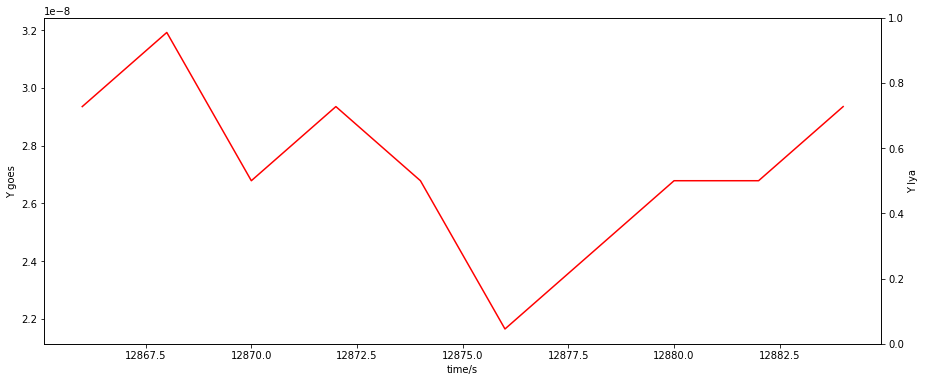

In [199]:


#原始数据绘制
i=0
fig = plt.figure(figsize=(15,6))
ax1 = fig.add_subplot(111)
if(x_num_list[i]-4000>=0) and(lya_num_list[i]-0>=0): 
    print('情况一')
    c=x_num_list[i]-4000#大致往前推两个小时，作为坐标轴开始
    d=lya_num_list[i]-700
    time1=sheet3_x_time[c:c+10][i] #约2s的分辨率
    time2=sheet3_lya_time[d:d+10][i] #约10s的分辨率
    ax2 = ax1.twinx()

    ax1.set_ylabel('Y goes');

    ax2.set_ylabel('Y lya');
    ax1.set_xlabel('time/s');
        
    ax1.plot(time1,sheet3_x_value[c:c+10][i],color='r',label="xrs")
    plt.axvline(list_time_xrs_peak[i],color='red',linestyle='--')
    
    ax2.plot(time2,sheet3_lya_value[d:d+10][i],color='k',label="Lya")
    plt.axvline(list_time_lya_peak[i],color='k',linestyle='--')
    plt.title(picture_title[i],va = 'center',size=15)
        #plt.savefig('/home/tzy/Desktop/python_text/curve_png_new/'+picture_name[i]+'.png', format='png', bbox_inches='tight',dpi=600)
    #list_time_xrs_peak[i]=list_time_xrs_peak[i]+20  
    #sheet_lya_time.loc[i,('T_D')]=list_time_lya_peak[i]-list_time_xrs_peak[i]
    plt.show()
else:
    print('情况二')
    time1=sheet3_x_time[:][i] #约2s的分辨率
    time2=sheet3_lya_time[:][i] #约10s的分辨率
    ax2 = ax1.twinx()

    ax1.set_ylabel('Y goes');
    ax2.set_ylabel('Y lya');
    ax1.set_xlabel('time/s');
    ax1.plot(time1,sheet3_x_value[:][i],color='r',label="xrs")
    plt.axvline(list_time_xrs_peak[i],color='red',linestyle='--')
    ax2.plot(time2,sheet3_lya_value[:][i],color='k',label="Lya")
    plt.axvline(list_time_lya_peak[i],color='k',linestyle='--')
    plt.title(picture_title[i],va = 'center',size=15)
        #plt.savefig('/home/tzy/Desktop/python_text/curve_png_new/'+picture_name[i]+'.png', format='png', bbox_inches='tight',dpi=600)
    plt.show()

In [16]:
list_time_xrs_peak[i]=list_time_xrs_peak[i]+45
sheet_lya_time.loc[i,('T_D')]=list_time_lya_peak[i]-list_time_xrs_peak[i]
print('添加完毕')

添加完毕


In [17]:
list_time_lya_peak[i]-list_time_xrs_peak[i]

40

In [11]:
sheet_lya_time.head(75)

,Unnamed: 0,Unnamed: 0.1,N,DATE,START,PEAKT,ENDT,DUR(m),STARTF,PEAKF,ENDF,SIGNIF(%),CLASS,SIGN,CLASS_N,SUB,CON,T_D,SIGN_2,YEAR
0,0,0,1,2010-04-09,04:44:11,04:51:07,05:28:35,44.4,6.3596,6.4597,6.2006,1.5752,B3.7,1,3.700000e-07,0.000100,1.015740,-233,1,0.0
1,1,2,3,2010-06-09,08:40:46,08:50:36,09:04:38,23.9,6.0453,6.1144,6.0513,1.0426,B2.5,1,2.500000e-07,0.000063,1.010428,256,1,0.0
2,2,10,11,2010-07-31,05:24:46,05:28:03,05:36:37,11.8,6.3626,6.4236,6.3290,0.9599,B4.8,1,4.800000e-07,0.000061,1.009587,-57,0,0.0
3,3,29,30,2010-10-19,13:17:46,13:22:51,13:31:26,13.7,6.8444,6.9131,6.8538,0.8663,B5.1,1,5.100000e-07,0.000059,1.008652,-69,0,0.0
4,4,30,31,2010-10-23,17:27:09,17:33:09,17:57:23,30.2,6.7022,6.8117,6.7554,0.8334,B3.6,1,3.600000e-07,0.000056,1.008334,-236,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,70,1654,1655,2015-02-14,12:39:14,12:51:58,13:03:26,24.2,8.5560,8.6767,8.5935,0.9690,B7.1,1,7.100000e-07,0.000083,1.009682,468,1,0.0
71,71,1656,1657,2015-02-18,16:15:41,16:19:31,16:31:09,15.5,7.9068,7.9860,7.8943,1.0013,B8.7,1,8.700000e-07,0.000079,1.010017,-89,0,0.0
72,72,1798,1799,2015-08-19,13:54:51,14:04:08,14:28:53,34.0,6.7675,6.8401,6.7675,1.0732,B6.4,1,6.400000e-07,0.000073,1.010728,-1012,1,0.0
73,73,1801,1802,2015-08-21,00:27:57,00:29:58,00:47:47,19.8,6.8672,6.9484,6.8714,1.1194,B9.7,1,9.700000e-07,0.000077,1.011206,-2,2,0.0


In [20]:
i='20100409'
sheet_lya = spio.readsav('/home/tzy/flare_data/sav/lc'+i+'_euve_g15.sav',python_dict=True, verbose=False)
sheet_lya['tsecs'][1]-sheet_lya['tsecs'][0]

10.240000009536743

In [267]:
sheet_lya_time_new.to_csv('lya_2010-2016_time_change_1.csv');
sheet_lya_time_new = pd.read_csv('lya_2010-2016_time_change_1.csv')

In [268]:
sheet_lya_time_new 

,Unnamed: 0,Unnamed: 0.1,N,DATE,START,PEAKT,ENDT,DUR(m),STARTF,PEAKF,ENDF,SIGNIF(%),CLASS,SIGN,CLASS_N,SUB,CON,T_D,SIGN_2,YEAR
0,0,0,1,2010-04-09,04:44:11,04:51:07,05:28:35,44.4,6.3596,6.4597,6.2006,1.5752,B3.7,1,3.700000e-07,0.000100,1.015740,-233,1,0.0
1,1,2,3,2010-06-09,08:40:46,08:50:36,09:04:38,23.9,6.0453,6.1144,6.0513,1.0426,B2.5,1,2.500000e-07,0.000063,1.010428,256,1,0.0
2,2,10,11,2010-07-31,05:24:46,05:28:03,05:36:37,11.8,6.3626,6.4236,6.3290,0.9599,B4.8,1,4.800000e-07,0.000061,1.009587,-57,0,0.0
3,3,29,30,2010-10-19,13:17:46,13:22:51,13:31:26,13.7,6.8444,6.9131,6.8538,0.8663,B5.1,1,5.100000e-07,0.000059,1.008652,-69,0,0.0
4,4,30,31,2010-10-23,17:27:09,17:33:09,17:57:23,30.2,6.7022,6.8117,6.7554,0.8334,B3.6,1,3.600000e-07,0.000056,1.008334,-236,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,2011,2012,2016-04-15,06:22:24,06:30:15,06:41:10,18.8,6.9429,7.0091,6.9429,0.9543,B7.7,1,7.700000e-07,0.000066,1.009535,255,1,0.0
96,96,2016,2017,2016-04-26,04:01:56,04:07:04,04:14:53,12.9,6.6968,6.7720,6.7056,0.9896,B4.9,1,4.900000e-07,0.000066,1.009902,-15,2,0.0
97,97,2017,2018,2016-04-27,00:05:49,00:08:00,00:29:18,23.5,6.7285,6.7949,6.7064,0.9864,B4.3,1,4.300000e-07,0.000066,1.009868,0,2,0.0
98,98,2032,2033,2016-05-25,01:54:30,02:01:04,02:21:39,27.1,6.7370,6.8125,6.7281,1.1209,B3.8,1,3.800000e-07,0.000076,1.011207,-116,0,0.0


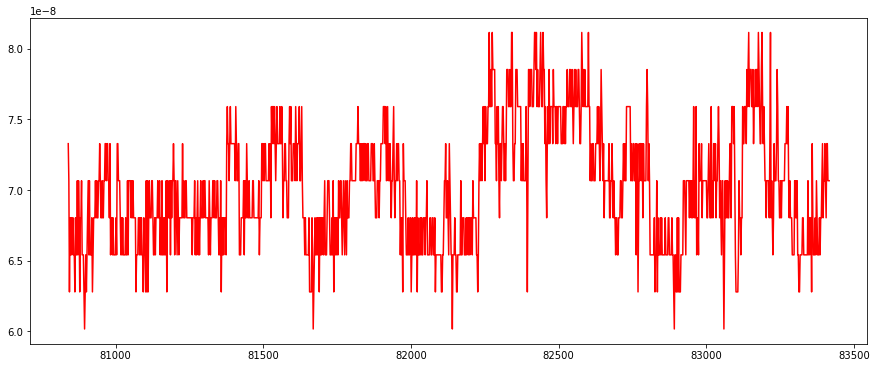

In [91]:
#原始数据绘制
from scipy import interpolate#插值用函数
for i in range(9,10):
    fig = plt.figure(figsize=(15,6))
    time1=sheet3_x_time[39000:][i] #约2s的分辨率
    plt.plot(time1,sheet3_x_value[39000:][i],color='r')
    plt.show()

In [ ]:
ype(np.float64(sheet_xrs['tsecs'][j]))